In [1]:
from dataclasses import replace
from pathlib import Path

from realistic_chan_simulation import (
    RealisticSimulationConfig,
    run_realistic_simulation,
    print_simulation_summary,
)

config = RealisticSimulationConfig()

config = replace(
    config,
    data_path=Path("DataAPI/data/TQQQ_5M.csv"),
    bsp_workbook_path=Path(
        "outputs/bspoints_TQQQ_5m_2020-2026.xlsx"
    ),
    replay_mode="regenerate",

    chan=replace(
        config.chan,
        code="TQQQ",
        trigger_step=True,
        start="2020-01-01",
        end="2026-05-30",
        warmup_bars=500,
        max_klines=500,
    ),

    risk=replace(
        config.risk,
        stop_loss_pct=0.10,
        take_profit_pct=0.15,
        trailing_stop_pct=0.15,
        max_holding_bars=78 * 10,
    ),

    backtest=replace(
        config.backtest,
        initial_capital=100_000,
        fee_pct=0.0,
        slippage_pct=0.0,
    ),
)

In [ ]:
from kline_2day_forecaster import ForecastConfig, train_forecaster

config = ForecastConfig(
    input_csv="DataAPI/data/TQQQ_5M.csv",
    output_dir="outputs/tqqq_xgboost_only",
    symbol="TQQQ",
    enable_chan=True,
)

result = train_forecaster(
    config,

    model_types=("xgboost",),
    prediction_model="xgboost",

    use_standard_technical_features=False,
    use_chan_bsp_features=False,

    train_start_date="2020-01-01",
    train_end_date="2020-12-31",
    test_start_date="2021-01-01",
    test_end_date="2021-06-30",

    chan_window_bars=500,

    verbose=True,
    progress_every_rows=2_500,

    xgboost_params={
        "n_estimators": 300,
        "max_depth": 5,
        "learning_rate": 0.03,
        "subsample": 0.80,
        "colsample_bytree": 0.80,
        "n_jobs": 1,
    },
)

[Run] Models=('xgboost',); default prediction=xgboost
[Run] Standard technical features=disabled; Chan features=enabled; Chan BSP features=disabled
[Run] Train=2020-01-01 to 2020-12-31; test=2021-01-01 to 2021-06-30
[Data] Loading DataAPI/data/TQQQ_5M.csv
[Data] Loaded 609,449 normalized rows: 2010-02-11 09:40:00 to 2026-06-12 19:55:00
[Data] Working period including warm-up: 2019-12-26 19:10:00 to 2021-07-01 19:55:00 (71,051 rows)
[Features] Calculating causal price/volume technical features
[Chan] Starting 71,051 rows; rolling window=500
[Chan] 2,500/71,051 (3.5%) | 10.6 rows/s | elapsed 3.9m | ETA 108.2m
[Chan] 5,000/71,051 (7.0%) | 9.6 rows/s | elapsed 8.6m | ETA 114.2m
[Chan] 7,500/71,051 (10.6%) | 9.4 rows/s | elapsed 13.3m | ETA 113.1m
[Chan] 10,000/71,051 (14.1%) | 9.2 rows/s | elapsed 18.2m | ETA 111.2m
[Chan] 12,500/71,051 (17.6%) | 9.2 rows/s | elapsed 22.8m | ETA 106.6m
[Chan] 15,000/71,051 (21.1%) | 9.1 rows/s | elapsed 27.5m | ETA 102.7m
[Chan] 17,500/71,051 (24.6%) | 9.0

PermissionError: [Errno 13] Permission denied: 'outputs\\tqqq_xgboost_only\\feature_manifest.csv'

In [5]:
from kline_2day_forecaster import ForecastConfig, train_forecaster

config = ForecastConfig(
    input_csv="DataAPI/data/TQQQ_5M.csv",
    output_dir=(
        "outputs/"
        "tqqq_xgboost_technical_multi_horizon"
    ),
    symbol="TQQQ",
    enable_chan=False,

    technical_windows=(
        78, 100, 156, 200,
        234, 390, 780,
    ),

    technical_rsi_periods=(
        78,
        156,
        390,
    ),

    technical_atr_periods=(
        78,
        156,
        390,
    ),

    technical_macd_periods=(
        #(12, 26, 9),
        #(39, 78, 20),
        (78, 156, 39),
        (156, 390, 78),
    ),
)

result = train_forecaster(
    config,

    model_types=("xgboost",),
    prediction_model="xgboost",

    use_standard_technical_features=True,
    use_chan_bsp_features=False,

    train_start_date="2020-01-01",
    train_end_date="2020-12-31",

    test_start_date="2021-01-01",
    test_end_date="2021-06-30",

    verbose=True,
    progress_every_rows=2_500,

    xgboost_params={
        "n_estimators": 300,
        "max_depth": 5,
        "learning_rate": 0.03,
        "subsample": 0.80,
        "colsample_bytree": 0.80,
        "n_jobs": 1,
    },
)

result

[Run] Models=('xgboost',); default prediction=xgboost
[Run] Standard technical features=enabled; Chan features=disabled; Chan BSP features=disabled
[Run] Train=2020-01-01 to 2020-12-31; test=2021-01-01 to 2021-06-30
[Data] Loading DataAPI/data/TQQQ_5M.csv
[Data] Loaded 609,449 normalized rows: 2010-02-11 09:40:00 to 2026-06-12 19:55:00
[Data] Working period including warm-up: 2019-12-23 15:45:00 to 2021-07-01 19:55:00 (71,331 rows)
[Features] Calculating causal price/volume technical features
[Chan] Disabled
[Labels] Building 2-trading-day variable-bar targets
[Data] Dataset ready: 71,331 rows, 78 columns, 71,148 labeled | 1.0s
[Split] train=42,114, validation=4,549, test=23,255
[Features] Selected 62 stationary model features
[XGBoost] Training target_max_gain_2d (300 trees, depth=5)
[XGBoost] target_max_gain_2d complete in 3.1s | test MAE=0.020008, RMSE=0.024875, R2=0.1193
[XGBoost] Training target_max_loss_2d (300 trees, depth=5)
[XGBoost] target_max_loss_2d complete in 3.0s | test 

{'model_path': 'outputs\\tqqq_xgboost_technical_multi_horizon\\model.joblib',
 'metrics': {'rows': {'train': 42114, 'validation': 4549, 'test': 23255},
  'models': {'xgboost': {'target_max_gain_2d': {'train': {'mae': 0.012642537854064346,
      'rmse': 0.01688366858309147,
      'r2': 0.8811171399494251},
     'validation': {'mae': 0.013224057431461728,
      'rmse': 0.016480030750267702,
      'r2': 0.1245082021259416},
     'test': {'mae': 0.020007558669596578,
      'rmse': 0.02487454478474615,
      'r2': 0.11926541598754514}},
    'target_max_loss_2d': {'train': {'mae': 0.01510256242638078,
      'rmse': 0.019861274780907833,
      'r2': 0.8722650443652805},
     'validation': {'mae': 0.018087988359017804,
      'rmse': 0.023732026386917616,
      'r2': -0.29194881165753594},
     'test': {'mae': 0.02722605369788973,
      'rmse': 0.03600202364373464,
      'r2': -0.19986655167856093}}}}},
 'feature_count': 62}

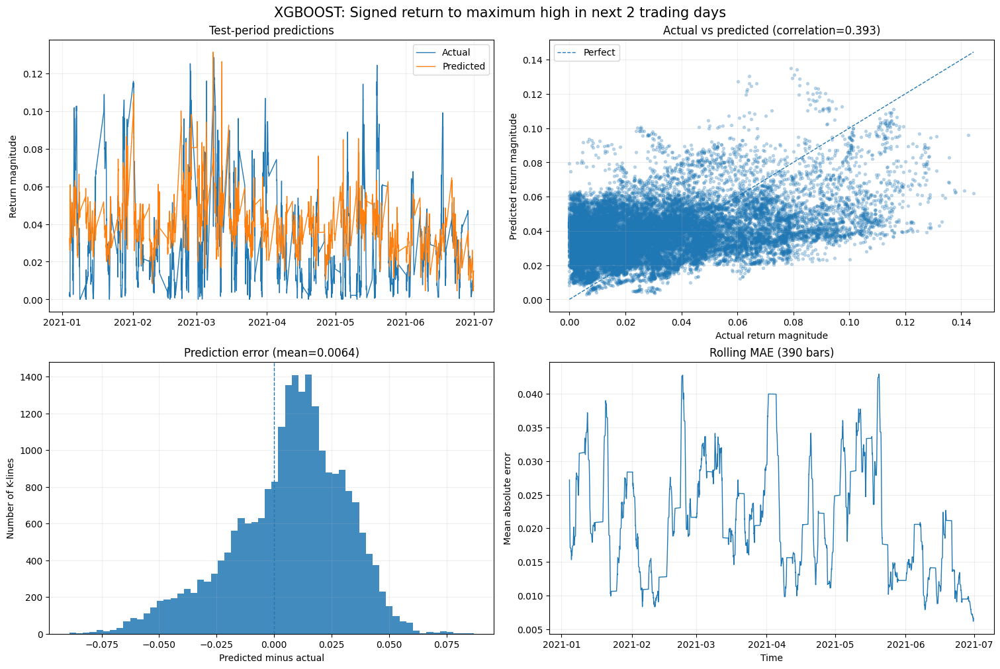

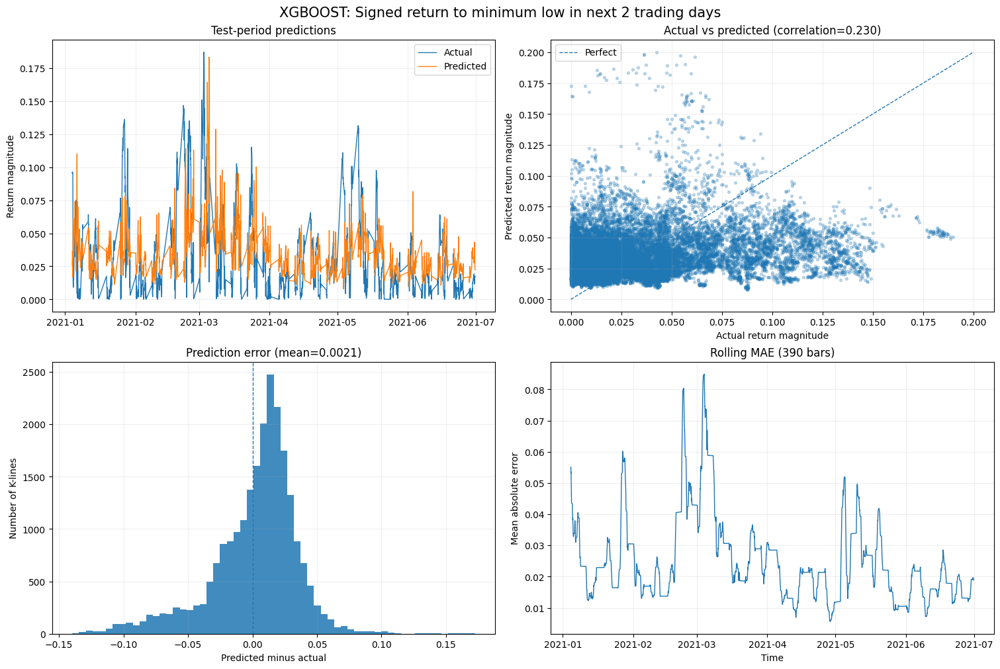

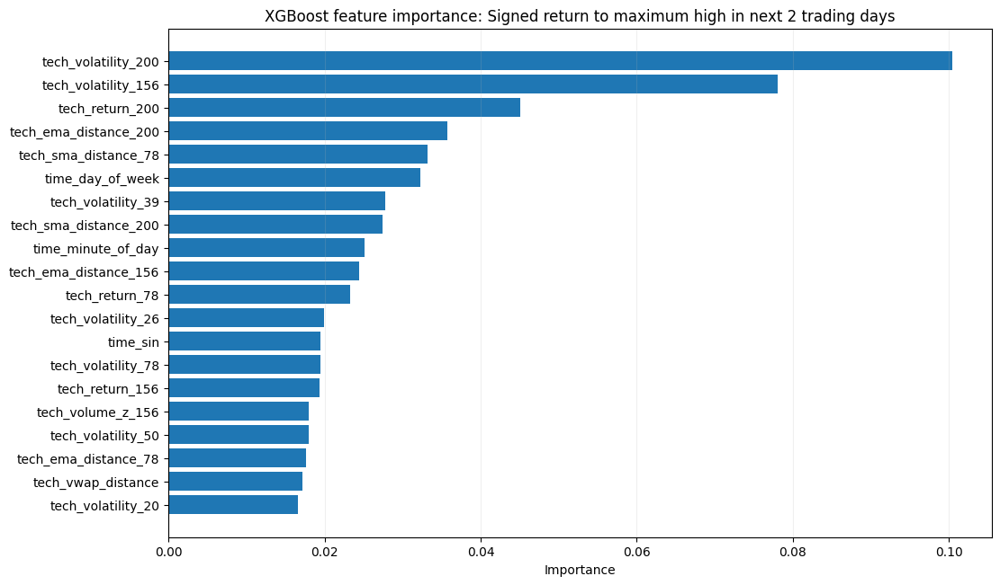

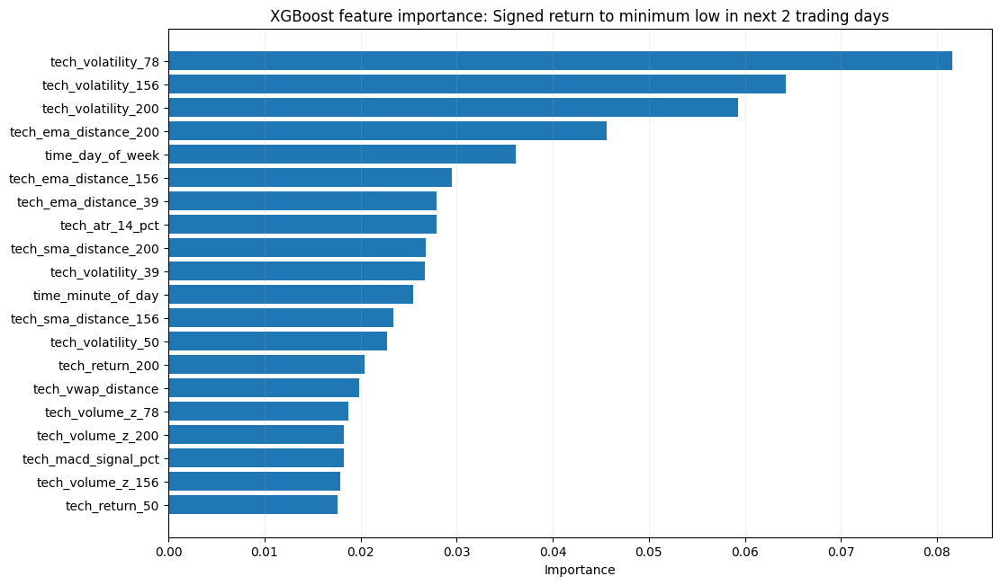

{'gain_diagnostics': 'outputs\\tqqq_xgboost_technical_only\\xgboost_gain_diagnostics.png',
 'loss_diagnostics': 'outputs\\tqqq_xgboost_technical_only\\xgboost_loss_diagnostics.png',
 'gain_feature_importance': 'outputs\\tqqq_xgboost_technical_only\\xgboost_gain_feature_importance.png',
 'loss_feature_importance': 'outputs\\tqqq_xgboost_technical_only\\xgboost_loss_feature_importance.png'}

In [1]:
import importlib
import kline_2day_forecaster.evaluation
import kline_2day_forecaster

# Reload the changed submodule first
importlib.reload(kline_2day_forecaster.evaluation)
importlib.reload(kline_2day_forecaster)
from kline_2day_forecaster import plot_forecast_results

plot_paths = plot_forecast_results(
    #output_dir="outputs/tqqq_xgboost_only",
    output_dir="outputs/tqqq_xgboost_technical_only",
    model="xgboost",

    # Rolling error window: 390 bars ≈ 5 regular trading days
    rolling_bars=390,

    # Avoid overcrowding the time-series chart
    max_time_points=2_000,

    # Number of important features to show
    top_features=20,

    show=True,
)

plot_paths

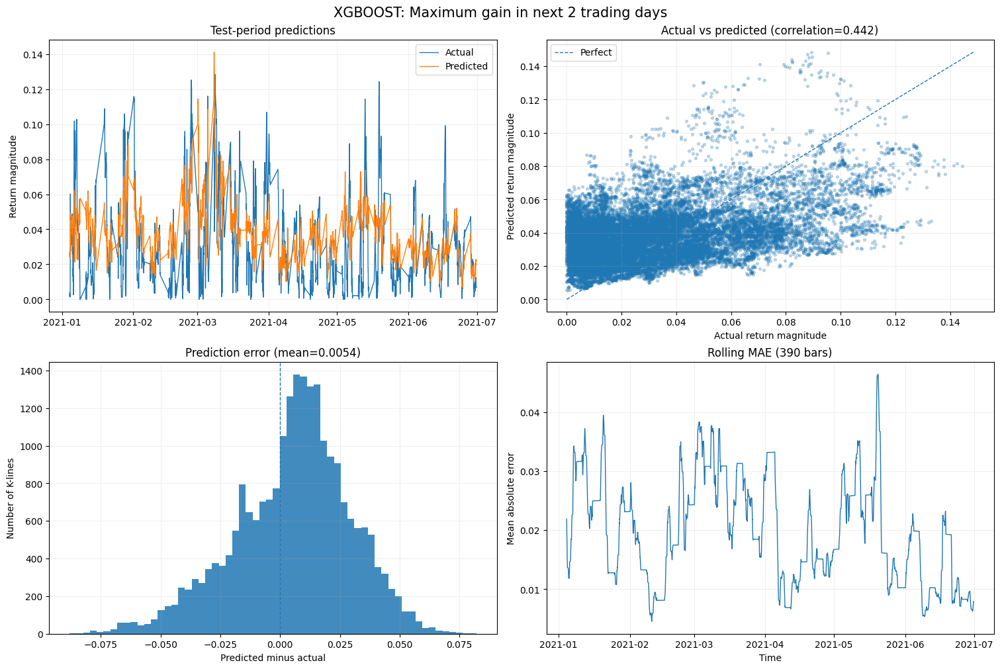

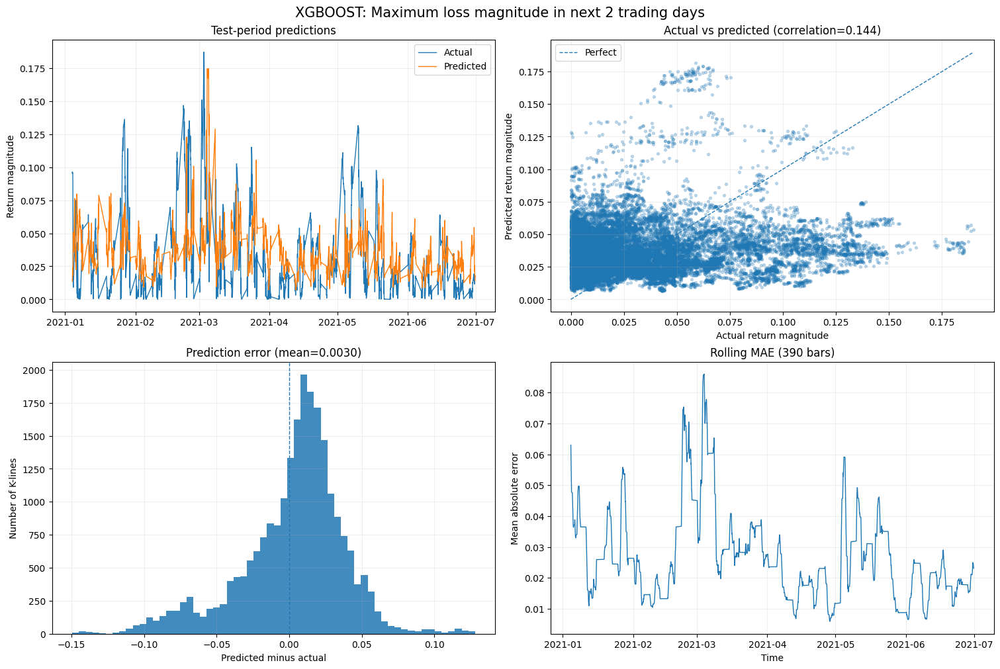

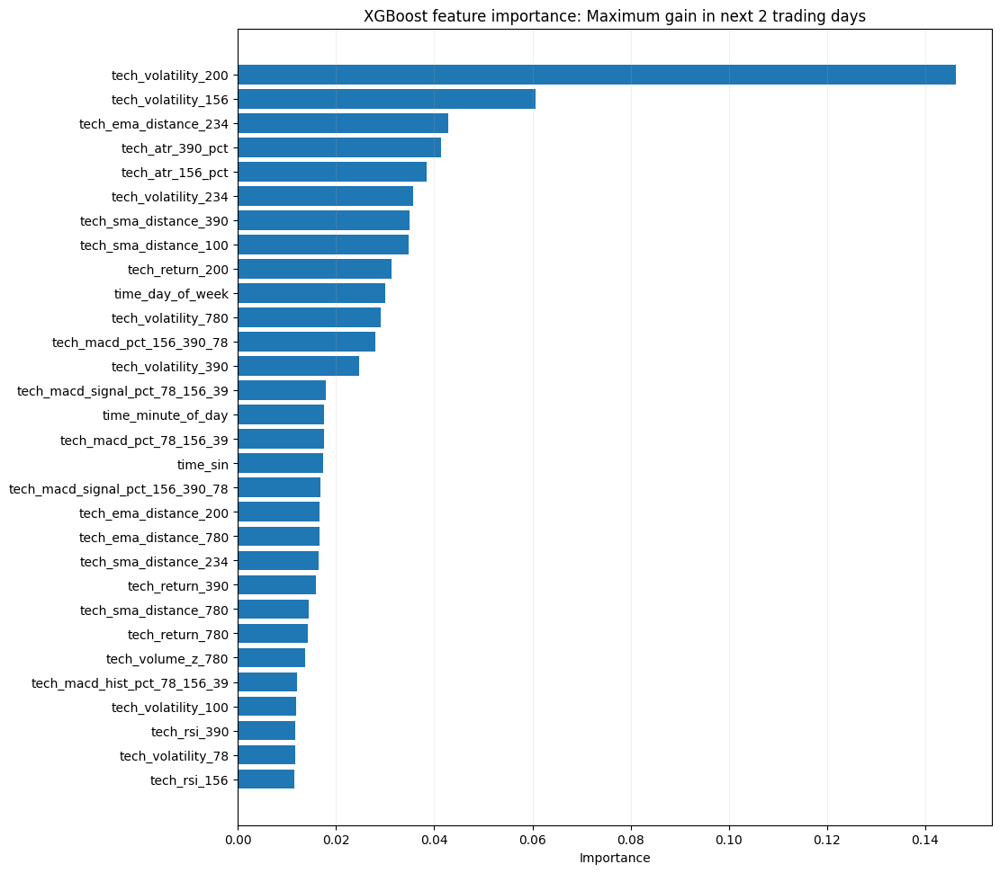

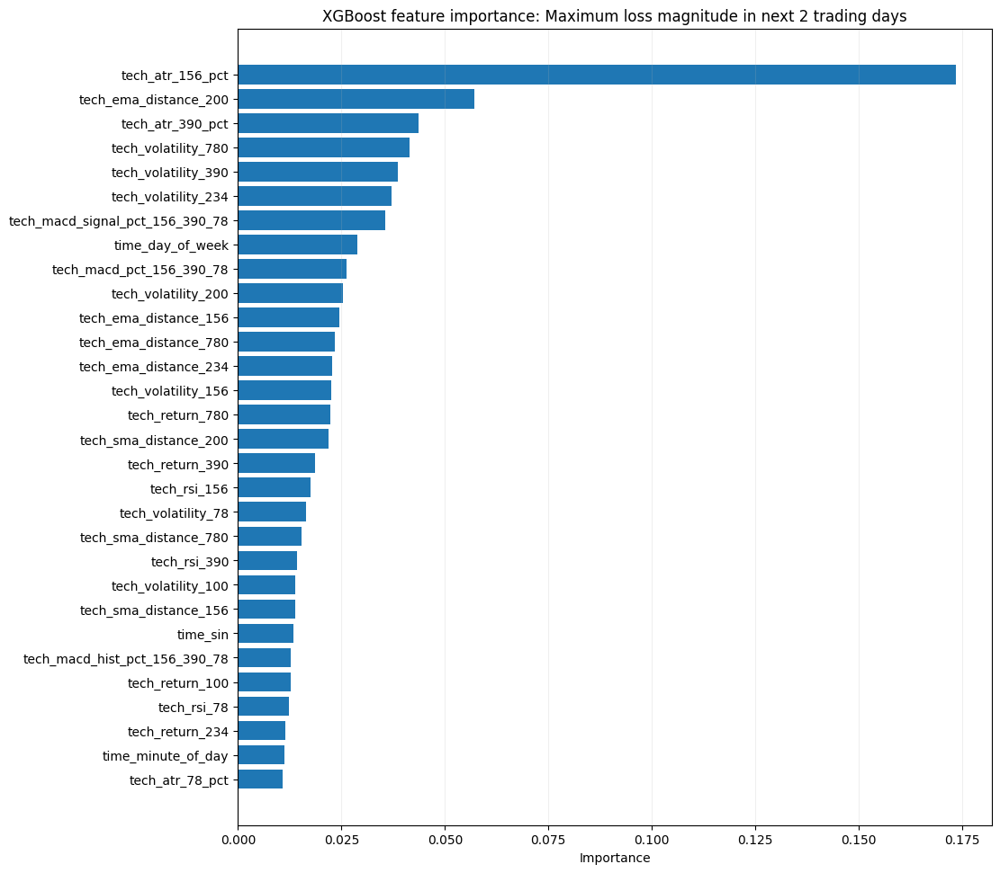

{'gain_diagnostics': 'outputs\\tqqq_xgboost_technical_multi_horizon\\xgboost_gain_diagnostics.png',
 'loss_diagnostics': 'outputs\\tqqq_xgboost_technical_multi_horizon\\xgboost_loss_diagnostics.png',
 'gain_feature_importance': 'outputs\\tqqq_xgboost_technical_multi_horizon\\xgboost_gain_feature_importance.png',
 'loss_feature_importance': 'outputs\\tqqq_xgboost_technical_multi_horizon\\xgboost_loss_feature_importance.png'}

In [6]:
import importlib
import kline_2day_forecaster.evaluation
import kline_2day_forecaster

# Reload the changed submodule first
importlib.reload(kline_2day_forecaster.evaluation)
importlib.reload(kline_2day_forecaster)
from kline_2day_forecaster import plot_forecast_results

new_plot_paths = plot_forecast_results(
    output_dir=(
        "outputs/"
        "tqqq_xgboost_technical_multi_horizon"
    ),
    model="xgboost",
    rolling_bars=390,
    max_time_points=2_000,
    top_features=30,
    show=True,
)

new_plot_paths

In [ ]:
import importlib
import kline_2day_forecaster.evaluation
import kline_2day_forecaster

# Reload the changed submodule first
importlib.reload(kline_2day_forecaster.evaluation)

# Then reload the package exports
importlib.reload(kline_2day_forecaster)

from kline_2day_forecaster import plot_daily_forecast_review

daily_review = plot_daily_forecast_review(
    output_dir="outputs/tqqq_xgboost_only",
    model="xgboost",

    start="2021-01-01",
    end="2021-06-30",

    # Avoid displaying hundreds of figures in Jupyter
    show=False,

    # Also save a separate PNG for every trading day
    save_individual_pngs=True,
)

daily_review

{'pdf_path': 'outputs\\tqqq_xgboost_only\\xgboost_daily_forecast_review.pdf',
 'daily_png_paths': ['outputs\\tqqq_xgboost_only\\daily_forecast_review\\xgboost_2021-01-04.png',
  'outputs\\tqqq_xgboost_only\\daily_forecast_review\\xgboost_2021-01-05.png',
  'outputs\\tqqq_xgboost_only\\daily_forecast_review\\xgboost_2021-01-06.png',
  'outputs\\tqqq_xgboost_only\\daily_forecast_review\\xgboost_2021-01-07.png',
  'outputs\\tqqq_xgboost_only\\daily_forecast_review\\xgboost_2021-01-08.png',
  'outputs\\tqqq_xgboost_only\\daily_forecast_review\\xgboost_2021-01-11.png',
  'outputs\\tqqq_xgboost_only\\daily_forecast_review\\xgboost_2021-01-12.png',
  'outputs\\tqqq_xgboost_only\\daily_forecast_review\\xgboost_2021-01-13.png',
  'outputs\\tqqq_xgboost_only\\daily_forecast_review\\xgboost_2021-01-14.png',
  'outputs\\tqqq_xgboost_only\\daily_forecast_review\\xgboost_2021-01-15.png',
  'outputs\\tqqq_xgboost_only\\daily_forecast_review\\xgboost_2021-01-19.png',
  'outputs\\tqqq_xgboost_only\\dai

In [3]:
import importlib
import bsp_maturity_system

importlib.reload(bsp_maturity_system)

from bsp_maturity_system import generate_bsp_maturity_dataset

maturity_result = generate_bsp_maturity_dataset(
    config,

    path="outputs/bsp_quality_TQQQ_5m_2012-2026.xlsx",
    csv_path="outputs/bsp_quality_TQQQ_5m_2012-2026.csv",

    start="2012-01-01",
    end="2026-08-01 23:59:59",

    chan_window_bars=500,

    # Time allowed for an immature candidate to confirm
    maximum_resolution_bars=390,

    # Evaluate a mature BSP over the next two regular sessions
    post_maturity_validation_bars=156,

    # 0.001 means price must exceed the BSP boundary by 0.1%
    # Use 0.0 if an exact touch counts as covered.
    coverage_buffer_pct=0,

    include_types=(
        "1",
        "1p",
        "2",
        "2s",
        "3a",
        "3b",
    ),

    verbose=True,
    progress_every_rows=2_500,
)

maturity_result

[Maturity] 2,500/564,917 bars | candidates=426, resolved=426, open=0
[Maturity] 5,000/564,917 bars | candidates=810, resolved=810, open=0
[Maturity] 7,500/564,917 bars | candidates=1,180, resolved=1,180, open=0
[Maturity] 10,000/564,917 bars | candidates=1,652, resolved=1,652, open=0
[Maturity] 12,500/564,917 bars | candidates=2,079, resolved=2,079, open=0
[Maturity] 15,000/564,917 bars | candidates=2,389, resolved=2,389, open=0
[Maturity] 17,500/564,917 bars | candidates=2,730, resolved=2,730, open=0
[Maturity] 20,000/564,917 bars | candidates=3,134, resolved=3,134, open=0
[Maturity] 22,500/564,917 bars | candidates=3,627, resolved=3,627, open=0
[Maturity] 25,000/564,917 bars | candidates=4,033, resolved=4,033, open=0
[Maturity] 27,500/564,917 bars | candidates=4,477, resolved=4,477, open=0
[Maturity] 30,000/564,917 bars | candidates=4,781, resolved=4,781, open=0
[Maturity] 32,500/564,917 bars | candidates=5,096, resolved=5,096, open=0
[Maturity] 35,000/564,917 bars | candidates=5,499

{'excel_path': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\bsp_quality_TQQQ_5m_2012-2026.xlsx',
 'csv_path': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\bsp_quality_TQQQ_5m_2012-2026.csv',
 'quality_csv_path': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\bsp_quality_TQQQ_5m_2012-2026_quality.csv',
 'rows': 85325,
 'outcomes': {'invalidated': 45613, 'mature': 39712},
 'by_type': {'invalidated': {'1': 13801,
   '1p': 6631,
   '2': 10658,
   '2s': 12031,
   '3a': 2492},
  'mature': {'1': 11835, '1p': 4974, '2': 10048, '2s': 10358, '3a': 2497}},
 'quality_outcomes': {'covered': 28701,
  'structurally_invalidated': 8618,
  'held': 2393}}

In [4]:
from bsp_maturity_system import train_bsp_maturity_models

maturity_report = train_bsp_maturity_models(
    dataset_path="outputs/bsp_quality_TQQQ_5m_2012-2026.csv",
    output_dir="outputs/bsp_maturity_models_by_type",

    train_start_date="2012-01-01",
    train_end_date="2023-12-31",
    validation_start_date="2024-01-01",
    validation_end_date="2024-12-31",
    test_start_date="2025-01-01",
    test_end_date="2026-08-01 23:59:59",

    bsp_types=("1", "1p", "2", "2s", "3a", "3b"),
    minimum_rows_per_type=200,
    probability_threshold=0.50,

    xgboost_params={
        "n_estimators": 400,
        "max_depth": 5,
        "learning_rate": 0.03,
        "subsample": 0.80,
        "colsample_bytree": 0.80,
        "n_jobs": 1,
        "random_state": 42,
    },

    verbose=True,
)

maturity_report

c:\Users\TonyTang\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\impute\_base.py:637: UserWarning: Skipping features without any observed values: ['feat_bsp2_retrace_rate' 'feat_bsp2_break_bi_amp'
 'feat_bsp2_break_bi_bi_klu_cnt' 'feat_bsp2_break_bi_amp_rate'
 'feat_bsp2_bi_amp' 'feat_bsp2_bi_klu_cnt' 'feat_bsp2_bi_amp_rate'
 'feat_bsp3_zs_height' 'feat_bsp3_bi_amp' 'feat_bsp3_bi_klu_cnt'
 'feat_bsp3_bi_amp_rate']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[Maturity model 1] test rows=2,566, precision=0.600, recall=0.732, PR-AUC=0.668


c:\Users\TonyTang\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\impute\_base.py:637: UserWarning: Skipping features without any observed values: ['feat_bsp2_retrace_rate' 'feat_bsp2_break_bi_amp'
 'feat_bsp2_break_bi_bi_klu_cnt' 'feat_bsp2_break_bi_amp_rate'
 'feat_bsp2_bi_amp' 'feat_bsp2_bi_klu_cnt' 'feat_bsp2_bi_amp_rate'
 'feat_bsp3_zs_height' 'feat_bsp3_bi_amp' 'feat_bsp3_bi_klu_cnt'
 'feat_bsp3_bi_amp_rate']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
c:\Users\TonyTang\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\impute\_base.py:637: UserWarning: Skipping features without any observed values: ['feat_bsp2_retrace_rate' 'feat_bsp2_break_bi_amp'
 'feat_bsp2_break_bi_bi_klu_cnt' 'feat_bsp2_break_bi_amp_rate'
 'feat_bsp2_bi_amp' 'feat_bsp2_bi_klu_cnt' 'feat_bsp2_bi_amp_rate'
 'feat_bsp3_zs_height' 'feat_bsp3_bi_amp' 'feat_bsp3_bi_klu_cnt'
 'feat_bsp3_bi_amp_rate']. At least one non-missing va

[Maturity model 1p] test rows=1,201, precision=0.580, recall=0.669, PR-AUC=0.642


c:\Users\TonyTang\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\impute\_base.py:637: UserWarning: Skipping features without any observed values: ['feat_bsp2_retrace_rate' 'feat_bsp2_break_bi_amp'
 'feat_bsp2_break_bi_bi_klu_cnt' 'feat_bsp2_break_bi_amp_rate'
 'feat_bsp2_bi_amp' 'feat_bsp2_bi_klu_cnt' 'feat_bsp2_bi_amp_rate'
 'feat_bsp2s_retrace_rate' 'feat_bsp2s_break_bi_amp'
 'feat_bsp2s_break_bi_klu_cnt' 'feat_bsp2s_break_bi_amp_rate'
 'feat_bsp2s_bi_amp' 'feat_bsp2s_bi_klu_cnt' 'feat_bsp2s_bi_amp_rate'
 'feat_bsp2s_lv' 'feat_bsp3_zs_height' 'feat_bsp3_bi_amp'
 'feat_bsp3_bi_klu_cnt' 'feat_bsp3_bi_amp_rate']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
c:\Users\TonyTang\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\impute\_base.py:637: UserWarning: Skipping features without any observed values: ['feat_bsp2_retrace_rate' 'feat_bsp2_break_bi_amp'
 'feat_bsp2_break_bi_bi_klu_cnt' 'feat_bsp2_brea

[Maturity model 2] test rows=2,018, precision=0.596, recall=0.718, PR-AUC=0.658


c:\Users\TonyTang\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\impute\_base.py:637: UserWarning: Skipping features without any observed values: ['feat_bsp1_bi_amp' 'feat_bsp1_bi_klu_cnt' 'feat_bsp1_bi_amp_rate'
 'feat_bsp2s_retrace_rate' 'feat_bsp2s_break_bi_amp'
 'feat_bsp2s_break_bi_klu_cnt' 'feat_bsp2s_break_bi_amp_rate'
 'feat_bsp2s_bi_amp' 'feat_bsp2s_bi_klu_cnt' 'feat_bsp2s_bi_amp_rate'
 'feat_bsp2s_lv' 'feat_bsp3_zs_height' 'feat_bsp3_bi_amp'
 'feat_bsp3_bi_klu_cnt' 'feat_bsp3_bi_amp_rate']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
c:\Users\TonyTang\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\impute\_base.py:637: UserWarning: Skipping features without any observed values: ['feat_bsp1_bi_amp' 'feat_bsp1_bi_klu_cnt' 'feat_bsp1_bi_amp_rate'
 'feat_bsp2s_retrace_rate' 'feat_bsp2s_break_bi_amp'
 'feat_bsp2s_break_bi_klu_cnt' 'feat_bsp2s_break_bi_amp_rate'
 'feat_bsp2s_bi_amp' 'feat_bsp2

[Maturity model 2s] test rows=2,240, precision=0.523, recall=0.692, PR-AUC=0.604


c:\Users\TonyTang\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\impute\_base.py:637: UserWarning: Skipping features without any observed values: ['feat_bsp2_retrace_rate' 'feat_bsp2_break_bi_amp'
 'feat_bsp2_break_bi_bi_klu_cnt' 'feat_bsp2_break_bi_amp_rate'
 'feat_bsp2_bi_amp' 'feat_bsp2_bi_klu_cnt' 'feat_bsp2_bi_amp_rate'
 'feat_bsp3_zs_height' 'feat_bsp3_bi_amp' 'feat_bsp3_bi_klu_cnt'
 'feat_bsp3_bi_amp_rate']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
c:\Users\TonyTang\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\impute\_base.py:637: UserWarning: Skipping features without any observed values: ['feat_bsp2_retrace_rate' 'feat_bsp2_break_bi_amp'
 'feat_bsp2_break_bi_bi_klu_cnt' 'feat_bsp2_break_bi_amp_rate'
 'feat_bsp2_bi_amp' 'feat_bsp2_bi_klu_cnt' 'feat_bsp2_bi_amp_rate'
 'feat_bsp3_zs_height' 'feat_bsp3_bi_amp' 'feat_bsp3_bi_klu_cnt'
 'feat_bsp3_bi_amp_rate']. At least one non-missing va

[Maturity model 3a] test rows=568, precision=0.533, recall=0.716, PR-AUC=0.576


c:\Users\TonyTang\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\impute\_base.py:637: UserWarning: Skipping features without any observed values: ['feat_bsp1_bi_amp' 'feat_bsp1_bi_klu_cnt' 'feat_bsp1_bi_amp_rate'
 'feat_bsp2_retrace_rate' 'feat_bsp2_break_bi_amp'
 'feat_bsp2_break_bi_bi_klu_cnt' 'feat_bsp2_break_bi_amp_rate'
 'feat_bsp2_bi_amp' 'feat_bsp2_bi_klu_cnt' 'feat_bsp2_bi_amp_rate'
 'feat_bsp2s_retrace_rate' 'feat_bsp2s_break_bi_amp'
 'feat_bsp2s_break_bi_klu_cnt' 'feat_bsp2s_break_bi_amp_rate'
 'feat_bsp2s_bi_amp' 'feat_bsp2s_bi_klu_cnt' 'feat_bsp2s_bi_amp_rate'
 'feat_bsp2s_lv']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
c:\Users\TonyTang\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\impute\_base.py:637: UserWarning: Skipping features without any observed values: ['feat_bsp1_bi_amp' 'feat_bsp1_bi_klu_cnt' 'feat_bsp1_bi_amp_rate'
 'feat_bsp2_retrace_rate' 'feat_bsp2_break_bi_amp'
 'f

{'models': {'1': {'train': {'rows': 17945,
    'positive_rate': 0.3811646698244636,
    'accuracy': 0.7728615213151295,
    'precision': 0.6751584283903675,
    'recall': 0.7788011695906433,
    'brier': 0.15888481430235313,
    'roc_auc': 0.8614111182202845,
    'pr_auc': 0.8001512389103292},
   'validation': {'rows': 1727,
    'positive_rate': 0.3665315576143602,
    'accuracy': 0.7127967573827446,
    'precision': 0.5952712100139083,
    'recall': 0.6761453396524486,
    'brier': 0.1873609351414803,
    'roc_auc': 0.7783789794108897,
    'pr_auc': 0.6705376726440306},
   'test': {'rows': 2566,
    'positive_rate': 0.37568199532346064,
    'accuracy': 0.715900233826968,
    'precision': 0.5998300764655905,
    'recall': 0.7323651452282157,
    'brier': 0.18782816099347194,
    'roc_auc': 0.7878067353567377,
    'pr_auc': 0.6682517375132442}},
  '1p': {'train': {'rows': 8485,
    'positive_rate': 0.36912197996464347,
    'accuracy': 0.8347672362993518,
    'precision': 0.7462984054669

In [6]:
import importlib
import bsp_trade_labeling

importlib.reload(bsp_trade_labeling)

label_result = bsp_trade_labeling.label_bspoints_for_training(
    "outputs/bsp_quality_TQQQ_5m_2012-2026.xlsx",
    output_csv="outputs/bsp_trade_labels_TQQQ_5m_2012-2026.csv",
    sheet_name="BSP Points",
    include_sell_supersession=True,
    verbose=True,
)

label_result

[BSP labels] Full dataset:     C:\Users\TonyTang\Documents\chan.py\outputs\bsp_trade_labels_TQQQ_5m_2012-2026.csv
[BSP labels] Training dataset: C:\Users\TonyTang\Documents\chan.py\outputs\bsp_trade_labels_TQQQ_5m_2012-2026_training.csv
[BSP labels] rows=85,325, training=85,325, positive=39,797, negative=45,528
bsp_type direction  trade_maturity_status  rows
       1       buy               immature  5381
       1       buy                 mature  5163
       1       buy   superseded_lower_buy     1
       1      sell               immature  8420
       1      sell                 mature  6668
       1      sell superseded_higher_sell     3
      1p       buy               immature  2217
      1p       buy                 mature  1815
      1p       buy   superseded_lower_buy     1
      1p      sell               immature  4413
      1p      sell                 mature  3159
       2       buy               immature  4335
       2       buy                 mature  4594
       2       

{'output_csv': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\bsp_trade_labels_TQQQ_5m_2012-2026.csv',
 'training_output_csv': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\bsp_trade_labels_TQQQ_5m_2012-2026_training.csv',
 'rows': 85325,
 'training_rows': 85325,
 'positive_rows': 39797,
 'negative_rows': 45528,
 'summary':    bsp_type direction   trade_maturity_status  rows
 0         1       buy                immature  5381
 1         1       buy                  mature  5163
 2         1       buy    superseded_lower_buy     1
 3         1      sell                immature  8420
 4         1      sell                  mature  6668
 5         1      sell  superseded_higher_sell     3
 6        1p       buy                immature  2217
 7        1p       buy                  mature  1815
 8        1p       buy    superseded_lower_buy     1
 9        1p      sell                immature  4413
 10       1p      sell                  mature  3159
 11        2       buy        

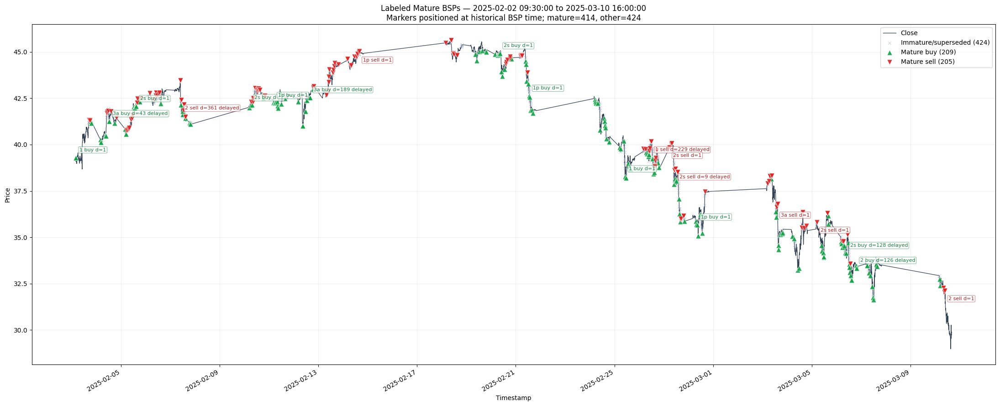

{'figure': <Figure size 2200x900 with 1 Axes>,
 'axes': <Axes: title={'center': 'Labeled Mature BSPs — 2025-02-02 09:30:00 to 2025-03-10 16:00:00\nMarkers positioned at historical BSP time; mature=414, other=424'}, xlabel='Timestamp', ylabel='Price'>,
 'points':        klu_idx            timestamp  klu_open  klu_high  klu_low  klu_close  \
 9345    499356  2025-02-03 04:00:00    39.180   39.4400  38.0000    39.2950   
 9346    499356  2025-02-03 04:00:00    39.180   39.4400  38.0000    39.2950   
 9347    499356  2025-02-03 04:00:00    39.180   39.4400  38.0000    39.2950   
 84937   499507  2025-02-03 16:35:00    40.880   41.2700  40.8299    41.1846   
 84938   499508  2025-02-03 16:40:00    41.190   41.2848  41.1600    41.2074   
 ...        ...                  ...       ...       ...      ...        ...   
 56772   504023  2025-03-10 08:55:00    32.155   32.1700  32.0800    32.1550   
 56773   504024  2025-03-10 09:00:00    32.155   32.1750  32.0450    32.0550   
 56776   504026  2

In [63]:
import importlib
import bsp_trade_labeling

importlib.reload(bsp_trade_labeling)

from bsp_trade_labeling import plot_labeled_mature_bspoints

plot_result = plot_labeled_mature_bspoints(
    labeled_path="outputs/bsp_trade_labels_TQQQ_5m_2012-2026.csv",
    price_csv="DataAPI/data/TQQQ_5M.csv",

    start="2025-02-02 09:30:00",
    end="2025-03-10 16:00:00",

    bsp_types=("1", "1p", "2", "2s", "3a"),
    direction=None,       # None, "buy", or "sell"

    timestamp_basis="bsp",
    annotate_max=20,
    show_immature=True,

    output_path="outputs/mature_bsp_plot_2025-01-02_to_2025-01-10.png",
    show=True,
)

plot_result

In [41]:
import importlib
import bsp_trade_labeling

importlib.invalidate_caches()
bsp_trade_labeling = importlib.reload(
    bsp_trade_labeling
)

trade_model_report = (
    bsp_trade_labeling
    .train_bsp_trade_models(
        labeled_path=(
            "outputs/"
            "bsp_trade_labels_TQQQ_5m_"
            "2012-2026_training.csv"
        ),
        output_dir=(
            "outputs/"
            "bsp_trade_models_no_delay_features"
        ),

        train_start_date="2012-01-01",
        train_end_date="2023-12-31",

        validation_start_date="2024-01-01",
        validation_end_date="2024-12-31",

        test_start_date="2025-01-01",
        test_end_date="2026-08-01 23:59:59",

        bsp_types=("1", "1p", "2", "2s", "3a"),

        minimum_rows_per_type=200,
        probability_threshold=0.50,

        # Now False by default; included explicitly for clarity.
        include_delay_features=False,

        xgboost_params={
            "n_estimators": 300,
            "max_depth": 4,
            "learning_rate": 0.03,
            "min_child_weight": 5,
            "subsample": 0.80,
            "colsample_bytree": 0.80,
            "reg_alpha": 0.10,
            "reg_lambda": 2.0,
            "n_jobs": 1,
            "random_state": 42,
        },

        verbose=True,
    )
)

[Trade maturity 1] test rows=2,978, precision=0.748, recall=0.751, PR-AUC=0.853
[Trade maturity 1p] test rows=1,353, precision=0.724, recall=0.717, PR-AUC=0.821
[Trade maturity 2] test rows=2,466, precision=0.773, recall=0.745, PR-AUC=0.871
[Trade maturity 2s] test rows=2,740, precision=0.770, recall=0.715, PR-AUC=0.863
[Trade maturity 3a] test rows=684, precision=0.739, recall=0.719, PR-AUC=0.847


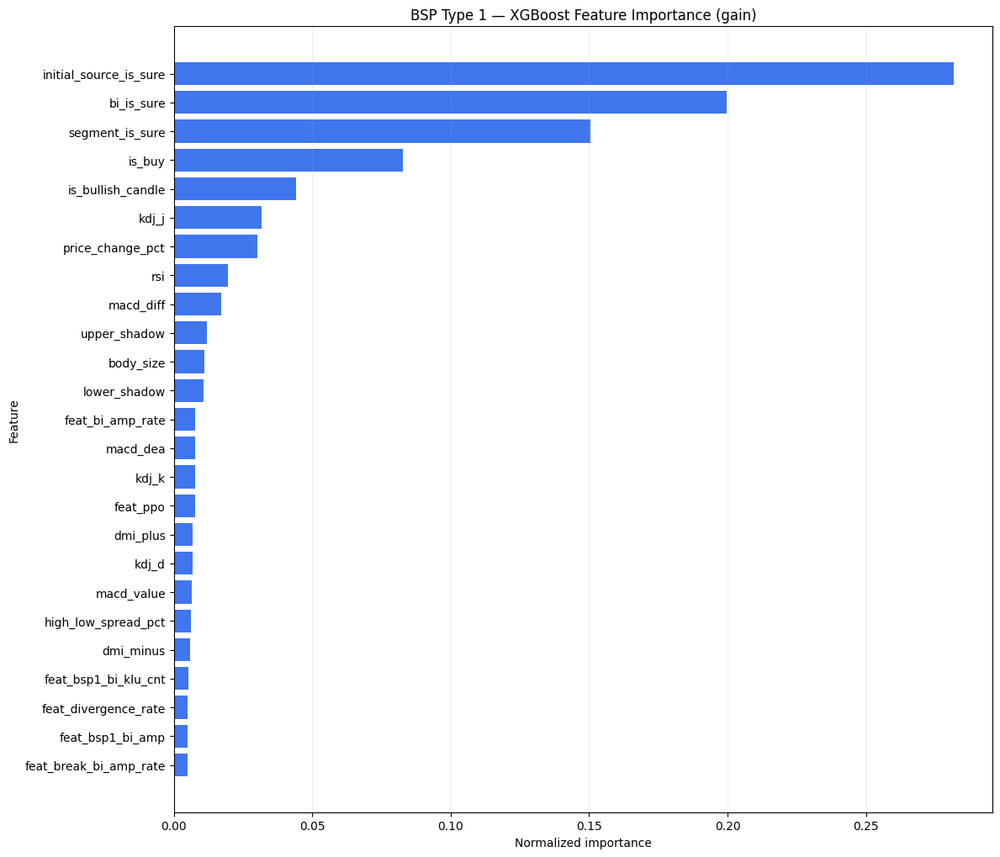

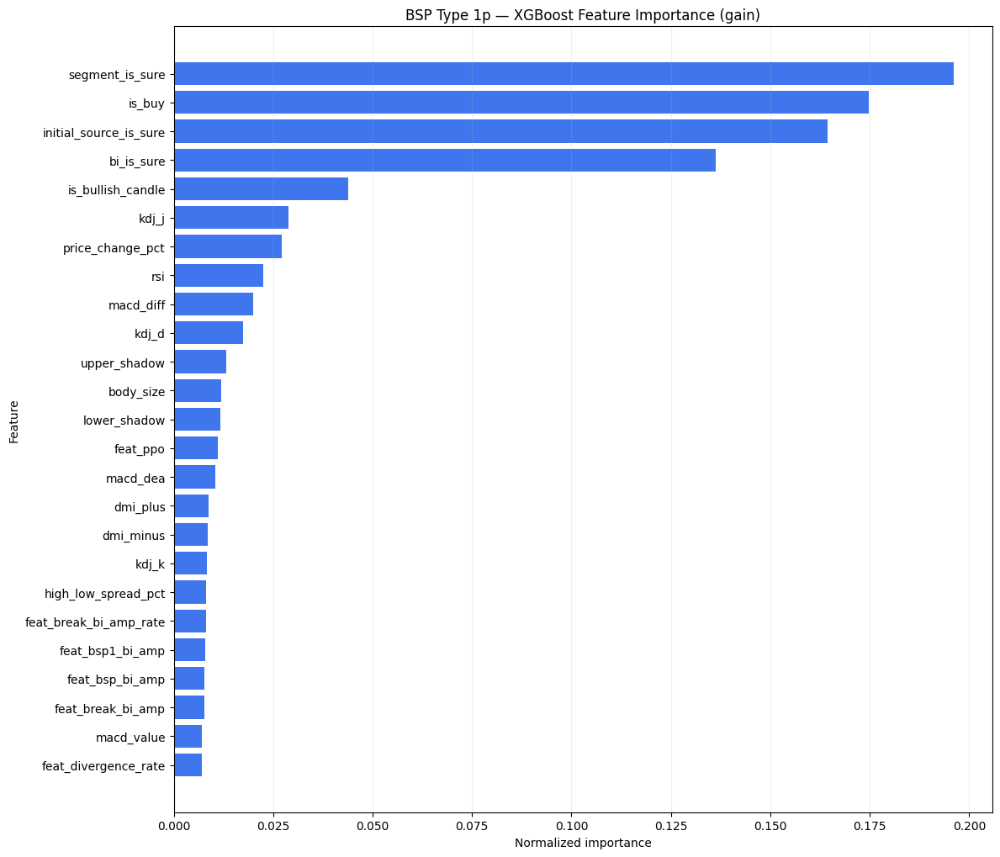

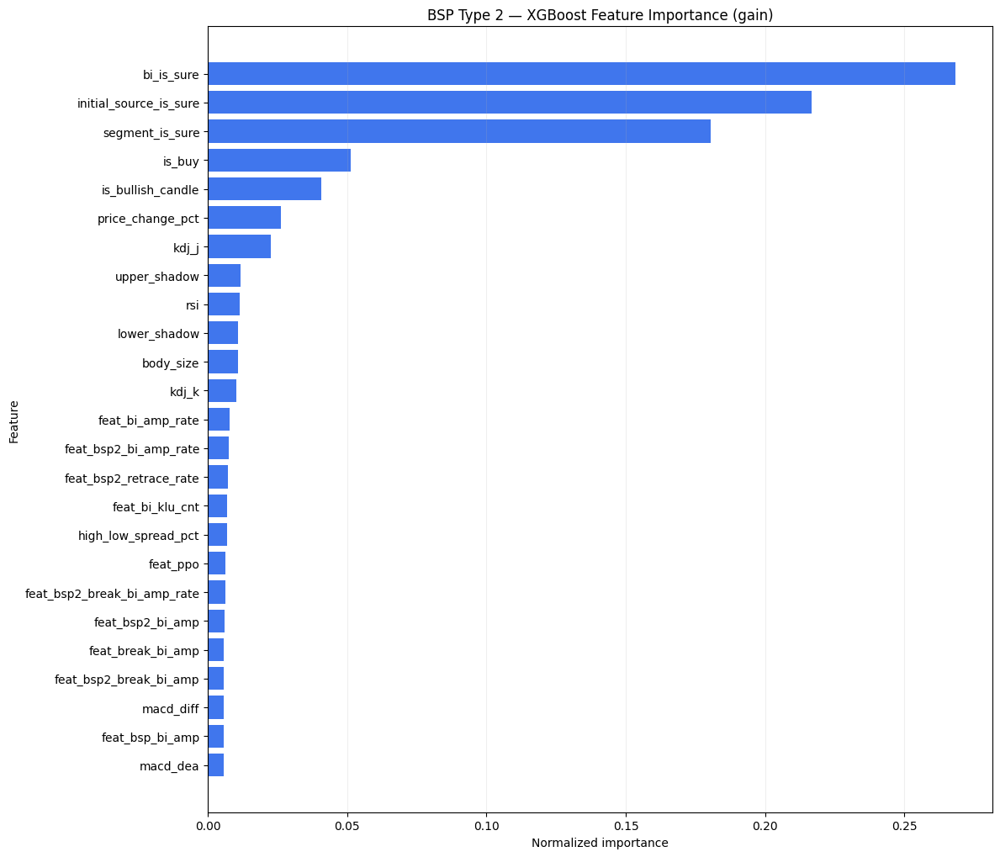

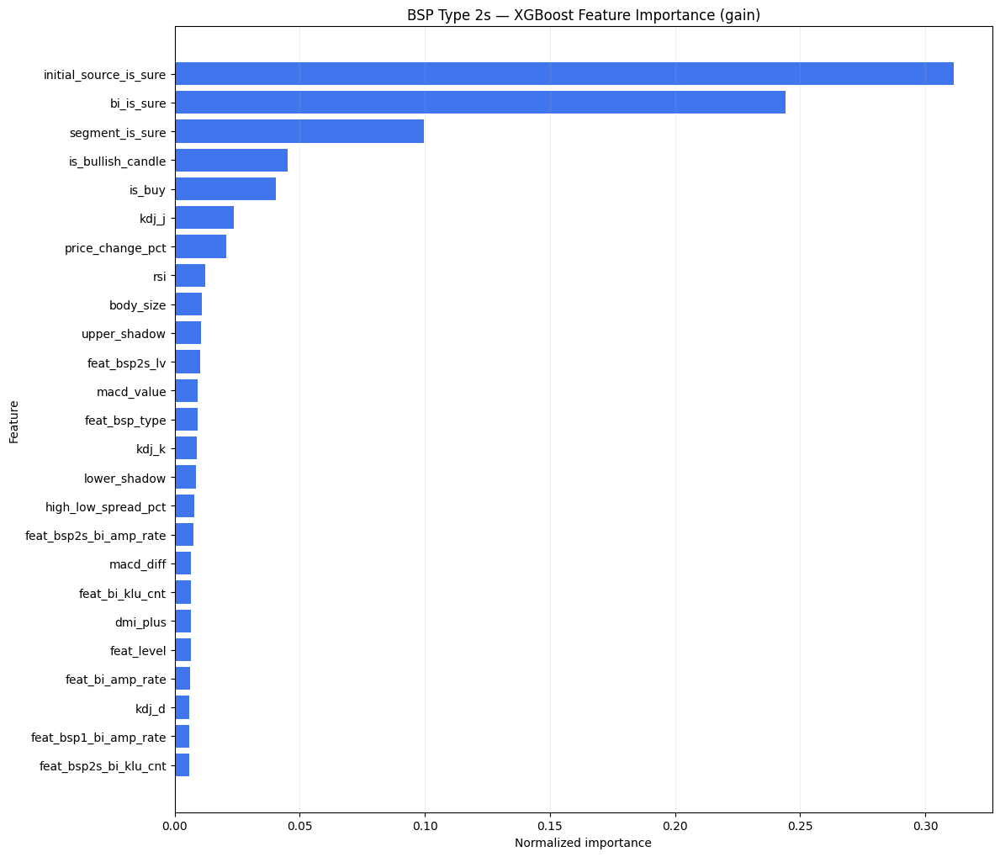

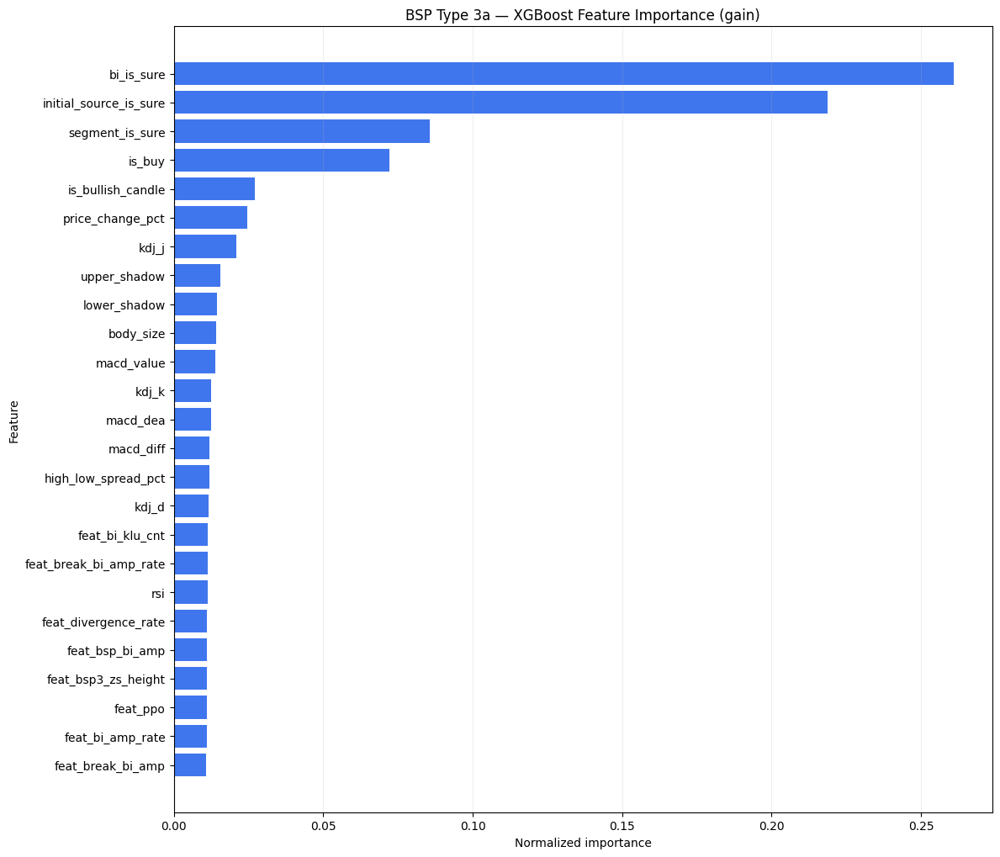

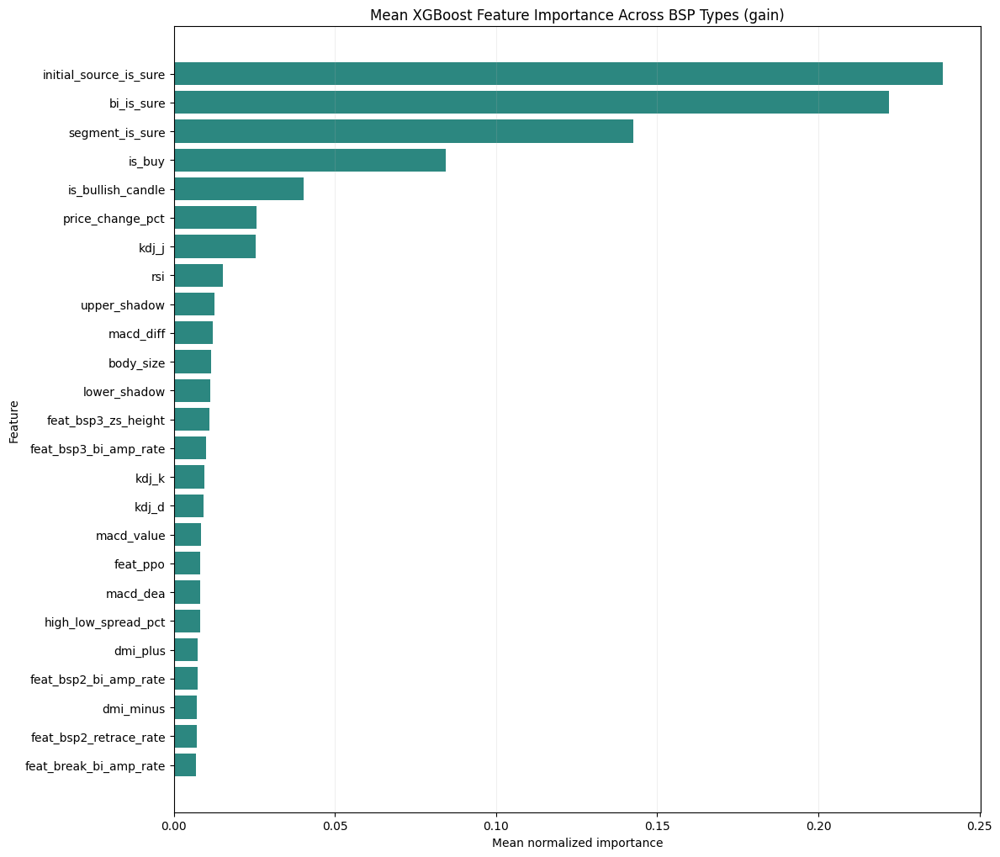

In [43]:
importance_result = (
    bsp_trade_labeling
    .plot_bsp_trade_feature_importance(
        model_dir=(
            "outputs/"
            "bsp_trade_models_no_delay_features"
        ),
        importance_type="gain",
        top_n=25,
        normalize=True,
        show=True,
    )
)

In [44]:
comparison_report = train_bsp_trade_models(
    labeled_path=(
        "outputs/"
        "bsp_trade_labels_TQQQ_5m_2012-2026_training.csv"
    ),
    output_dir="outputs/bsp_trade_models_without_delay",

    train_start_date="2012-01-01",
    train_end_date="2023-12-31",
    validation_start_date="2024-01-01",
    validation_end_date="2024-12-31",
    test_start_date="2025-01-01",
    test_end_date="2026-08-01 23:59:59",

    bsp_types=("1", "1p", "2", "2s", "3a"),

    minimum_rows_per_type=200,
    probability_threshold=0.50,

    include_delay_features=False,

    xgboost_params={
        "n_estimators": 300,
        "max_depth": 4,
        "learning_rate": 0.03,
        "min_child_weight": 5,
        "subsample": 0.80,
        "colsample_bytree": 0.80,
        "reg_alpha": 0.10,
        "reg_lambda": 2.0,
        "n_jobs": 1,
        "random_state": 42,
    },

    verbose=True,
)

[Trade maturity 1] test rows=2,978, precision=0.748, recall=0.751, PR-AUC=0.853
[Trade maturity 1p] test rows=1,353, precision=0.724, recall=0.717, PR-AUC=0.821
[Trade maturity 2] test rows=2,466, precision=0.773, recall=0.745, PR-AUC=0.871
[Trade maturity 2s] test rows=2,740, precision=0.770, recall=0.715, PR-AUC=0.863
[Trade maturity 3a] test rows=684, precision=0.739, recall=0.719, PR-AUC=0.847


In [10]:
import importlib
import bsp_trade_labeling

importlib.reload(bsp_trade_labeling)

from bsp_trade_labeling import create_predicted_mature_signals

prediction_result = create_predicted_mature_signals(
    bspoint_path=(
        "outputs/"
        "bsp_trade_labels_TQQQ_5m_2012-2026_training.csv"
    ),
    model_dir="outputs/bsp_trade_models_without_delay",

    # Use the out-of-sample test period.
    start="2025-01-01",
    end="2026-08-01 23:59:59",

    bsp_types=("1", "1p", "2", "2s", "3a", "3b"),

    probability_threshold=0.50,

    # Apply your deterministic trading rules.
    apply_delayed_rule=True,
    apply_already_sure_rule=True,

    output_csv="outputs/predicted_bsp_maturity_2025-2026.csv",
    signals_output_csv="outputs/predicted_mature_signals_2025-2026.csv",

    verbose=True,
)

prediction_result

[BSP prediction] Models loaded: ['1', '1p', '2', '2s', '3a']
[BSP prediction] Missing models: ['3b']
[BSP prediction] candidates=10,221, signals=4,658
[BSP prediction] All rows: C:\Users\TonyTang\Documents\chan.py\outputs\predicted_bsp_maturity_2025-2026.csv
[BSP prediction] Signals:  C:\Users\TonyTang\Documents\chan.py\outputs\predicted_mature_signals_2025-2026.csv
bsp_type direction prediction_source  signals
       1       buy already_sure_rule      213
       1       buy           xgboost      445
       1      sell already_sure_rule      199
       1      sell           xgboost      524
      1p       buy already_sure_rule       52
      1p       buy           xgboost      171
      1p      sell already_sure_rule      100
      1p      sell      delayed_rule        1
      1p      sell           xgboost      282
       2       buy already_sure_rule      226
       2       buy      delayed_rule        1
       2       buy           xgboost      337
       2      sell already_sure_r

{'output_csv': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\predicted_bsp_maturity_2025-2026.csv',
 'signals_output_csv': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\predicted_mature_signals_2025-2026.csv',
 'rows': 10221,
 'signal_rows': 4658,
 'models_loaded': ['1', '1p', '2', '2s', '3a'],
 'missing_models': ['3b'],
 'summary':    bsp_type direction  prediction_source  signals
 0         1       buy  already_sure_rule      213
 1         1       buy            xgboost      445
 2         1      sell  already_sure_rule      199
 3         1      sell            xgboost      524
 4        1p       buy  already_sure_rule       52
 5        1p       buy            xgboost      171
 6        1p      sell  already_sure_rule      100
 7        1p      sell       delayed_rule        1
 8        1p      sell            xgboost      282
 9         2       buy  already_sure_rule      226
 10        2       buy       delayed_rule        1
 11        2       buy            xgboost   

[BSP prediction] Models loaded: ['1']
[BSP prediction] candidates=10,216, signals=483
[BSP prediction] All rows: C:\Users\TonyTang\Documents\chan.py\outputs\predicted_bsp_maturity_no_delay_features_2025.csv
[BSP prediction] Signals:  C:\Users\TonyTang\Documents\chan.py\outputs\predicted_mature_signals_no_delay_features_2025.csv
bsp_type direction prediction_source  signals
       1       buy already_sure_rule      212
       1       buy           xgboost       55
       1      sell already_sure_rule      199
       1      sell           xgboost       17


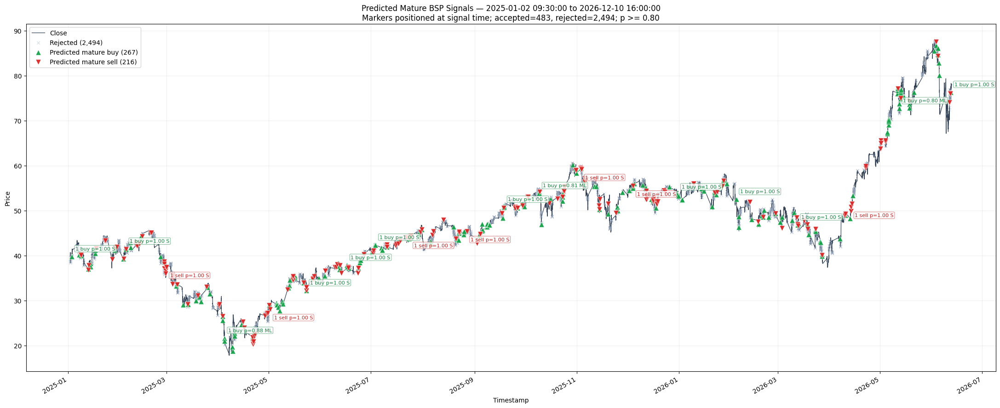

{'figure': <Figure size 2200x900 with 1 Axes>,
 'axes': <Axes: title={'center': 'Predicted Mature BSP Signals — 2025-01-02 09:30:00 to 2026-12-10 16:00:00\nMarkers positioned at signal time; accepted=483, rejected=2,494; p >= 0.80'}, xlabel='Timestamp', ylabel='Price'>,
 'predictions':        klu_idx            timestamp  klu_open  klu_high  klu_low  klu_close  \
 0       495617  2025-01-02 12:25:00    39.715   39.7150  39.1550    39.2025   
 1       495618  2025-01-02 12:30:00    39.195   39.1950  38.9000    38.9689   
 2       495619  2025-01-02 12:35:00    38.960   39.0000  38.6250    38.6775   
 3       495620  2025-01-02 12:40:00    38.670   38.7825  38.4800    38.6275   
 4       495621  2025-01-02 12:45:00    38.640   38.6800  38.3600    38.3650   
 ...        ...                  ...       ...       ...      ...        ...   
 10187   564709  2026-06-11 18:40:00    76.550   76.7500  76.5409    76.7300   
 10188   564710  2026-06-11 18:45:00    76.730   76.9500  76.7300    76.90

In [59]:
import importlib
import bsp_trade_labeling

importlib.invalidate_caches()
bsp_trade_labeling = importlib.reload(
    bsp_trade_labeling
)

# ---------------------------------------
# Graph and prediction controls
# ---------------------------------------

selected_bsp_types = (
    "1",
    #"1p",
    # "2",
    # "2s",
    # "3a",
)

selected_direction = None  # None, "buy", or "sell"
minimum_probability = 0.8

start_date = "2025-01-02 09:30:00"
end_date = "2026-12-10 16:00:00"


# ---------------------------------------
# Create predictions using models trained
# without delayed features
# ---------------------------------------

prediction_result = (
    bsp_trade_labeling
    .create_predicted_mature_signals(
        bspoint_path=(
            "outputs/"
            "bsp_trade_labels_TQQQ_5m_"
            "2012-2026_training.csv"
        ),
        model_dir=(
            "outputs/"
            "bsp_trade_models_no_delay_features"
        ),

        start=start_date,
        end=end_date,

        bsp_types=selected_bsp_types,
        probability_threshold=minimum_probability,

        # Apply deterministic rules after model prediction.
        apply_delayed_rule=True,
        apply_already_sure_rule=True,

        output_csv=(
            "outputs/"
            "predicted_bsp_maturity_"
            "no_delay_features_2025.csv"
        ),
        signals_output_csv=(
            "outputs/"
            "predicted_mature_signals_"
            "no_delay_features_2025.csv"
        ),

        verbose=True,
    )
)


# ---------------------------------------
# Plot predictions
# ---------------------------------------

plot_result = (
    bsp_trade_labeling
    .plot_predicted_mature_signals(
        predictions_path=(
            "outputs/"
            "predicted_bsp_maturity_"
            "no_delay_features_2025.csv"
        ),
        price_csv="DataAPI/data/TQQQ_5M.csv",

        start=start_date,
        end=end_date,

        bsp_types=selected_bsp_types,
        direction=selected_direction,
        minimum_probability=minimum_probability,

        # Plot signals when they became observable.
        timestamp_basis="snapshot",

        annotate_max=20,
        show_rejected=True,

        output_path=(
            "outputs/"
            "selected_bsp_signals_"
            "no_delay_features_2025.png"
        ),

        show=True,
    )
)

plot_result

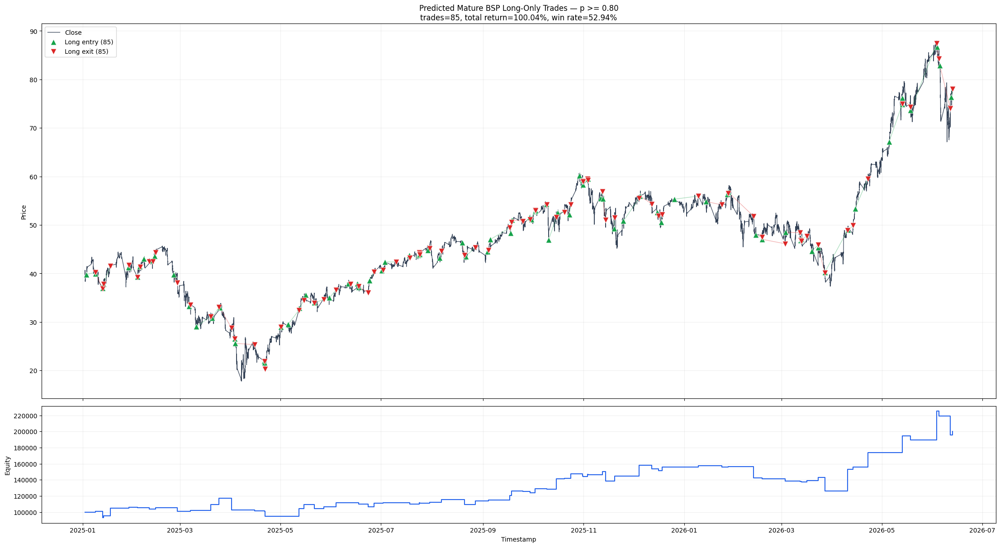

{'figure': <Figure size 2200x1200 with 2 Axes>,
 'axes': (<Axes: title={'center': 'Predicted Mature BSP Long-Only Trades — p >= 0.80\ntrades=85, total return=100.04%, win rate=52.94%'}, ylabel='Price'>,
  <Axes: xlabel='Timestamp', ylabel='Equity'>),
 'events':      klu_idx            timestamp  klu_open  klu_high  klu_low  klu_close  \
 0     495301  2024-12-30 18:05:00    40.440   40.4400  40.2500    40.3450   
 1     496231  2025-01-07 15:35:00    39.985   40.1250  39.8525    40.1225   
 2     496158  2025-01-07 09:30:00    42.860   42.9450  42.6091    42.6150   
 3     496158  2025-01-07 09:30:00    42.860   42.9450  42.6091    42.6150   
 4     496158  2025-01-07 09:30:00    42.860   42.9450  42.6091    42.6150   
 ..       ...                  ...       ...       ...      ...        ...   
 416   563451  2026-06-03 09:50:00    85.640   86.5200  85.4100    86.0850   
 417   564420  2026-06-10 10:35:00    74.665   74.7000  73.8030    73.9800   
 418   564672  2026-06-11 15:35:00   

In [60]:
import importlib
import bsp_trade_labeling

importlib.invalidate_caches()
bsp_trade_labeling = importlib.reload(
    bsp_trade_labeling
)

trade_plot_result = (
    bsp_trade_labeling
    .backtest_and_plot_predicted_bsp_signals(
        predictions_path=(
            "outputs/"
            "predicted_bsp_maturity_"
            "no_delay_features_2025.csv"
        ),
        price_csv="DataAPI/data/TQQQ_5M.csv",

        start=start_date,
        end=end_date,

        # Uses the same selected types as the signal graph.
        bsp_types=selected_bsp_types,
        minimum_probability=minimum_probability,

        initial_equity=100_000,

        # Example trading costs:
        commission_bps=0.0,
        slippage_bps=1.0,

        force_exit_at_end=True,

        output_path=(
            "outputs/"
            "selected_bsp_trade_plot_2025.png"
        ),
        trades_output_csv=(
            "outputs/"
            "selected_bsp_trades_2025.csv"
        ),

        show=True,
    )
)

trade_plot_result

[Comparison] Building one shared OHLCV + technical K-line dataset
[Data] Loading DataAPI/data/TQQQ_5M.csv
[Data] Loaded 609,449 normalized rows: 2010-02-11 09:40:00 to 2026-06-12 19:55:00
[Data] Working period including warm-up: 2013-12-18 12:10:00 to 2022-01-03 19:55:00 (298,802 rows)
[Features] Calculating causal price/volume technical features
[Chan] Disabled
[Labels] Building targets through the same time 2 trading sessions later
[Data] Dataset ready: 298,802 rows, 82 columns, 297,030 labeled | 2.3s
[Comparison] all_5min_technical: {'train': 223852, 'validation': 24579, 'test': 46740}, features=71
[Comparison] bsp_type_1_1p_buy: {'train': 5057, 'validation': 377, 'test': 889}, features=71
[Comparison] bsp_type_1_1p_sell: {'train': 8894, 'validation': 885, 'test': 1751}, features=71
[Comparison] bsp_type_2_2s_buy: {'train': 5955, 'validation': 611, 'test': 1151}, features=71
[Comparison] bsp_type_2_2s_sell: {'train': 9020, 'validation': 1028, 'test': 1873}, features=71
[Comparison] 

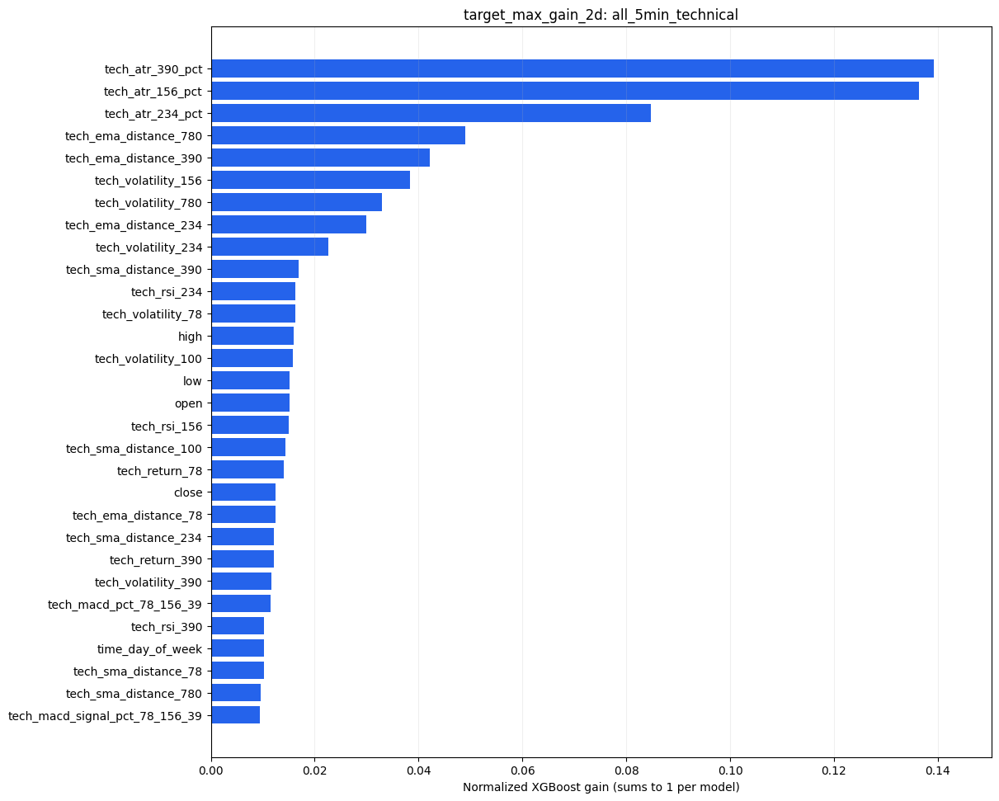

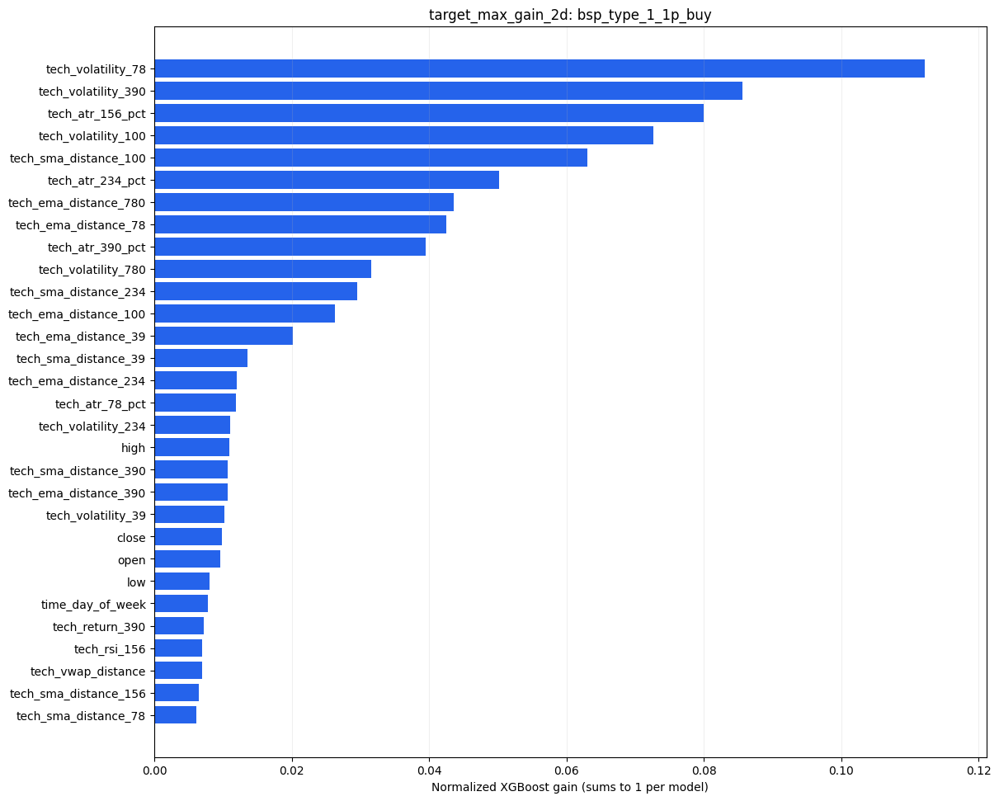

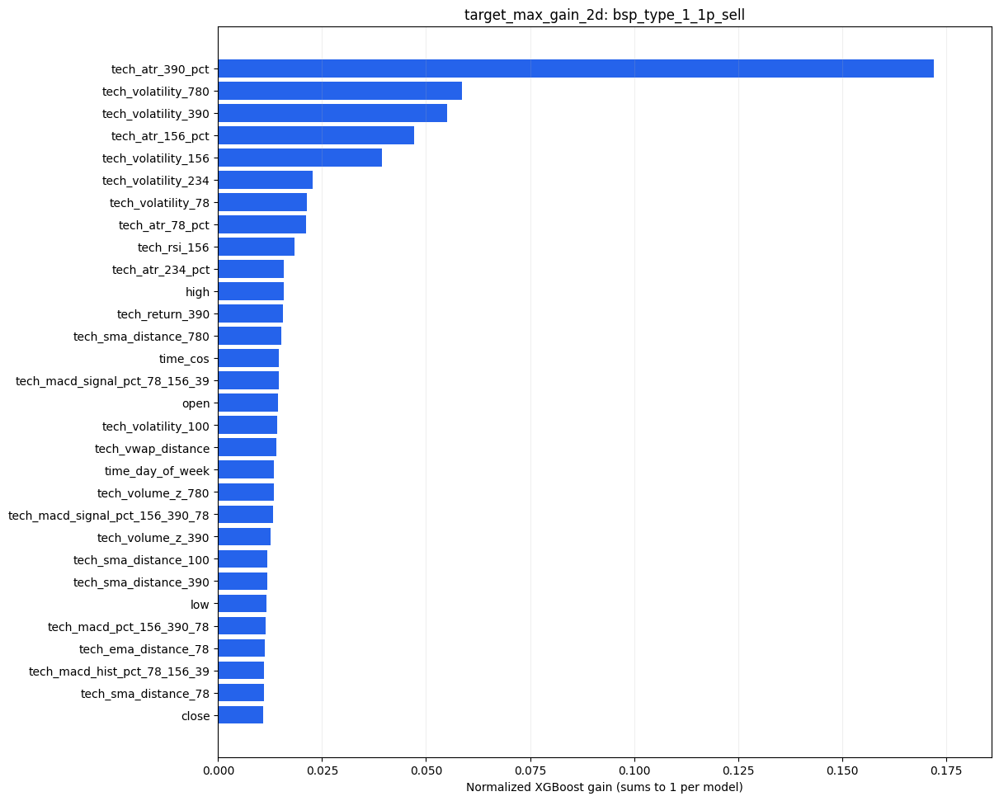

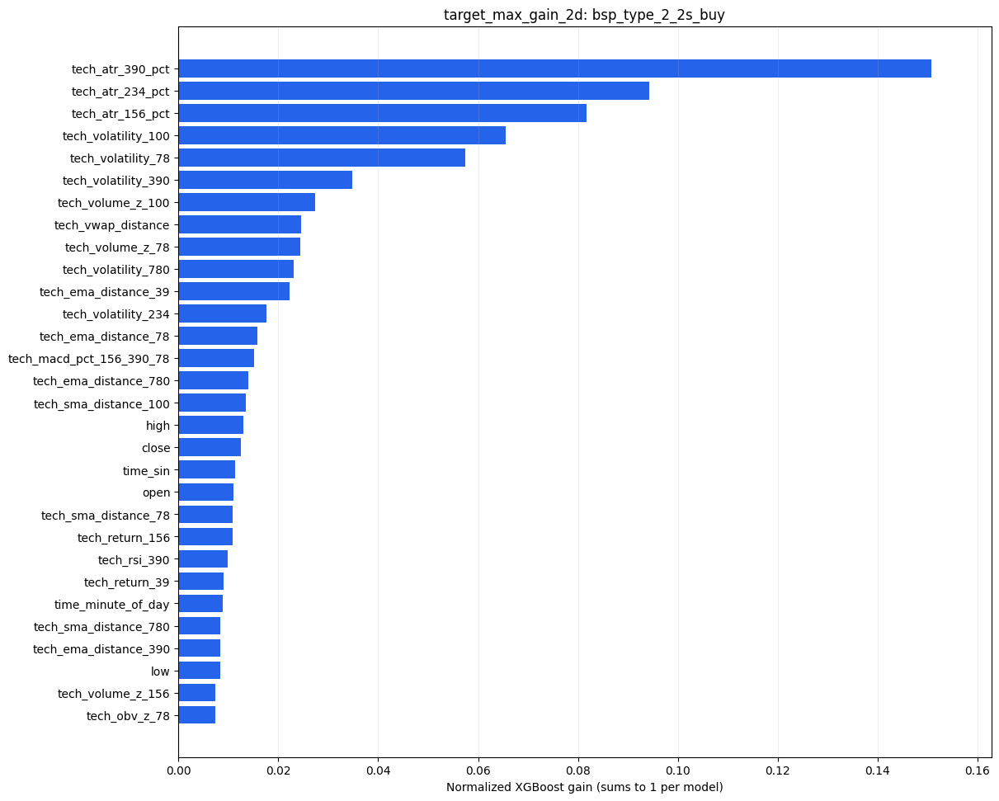

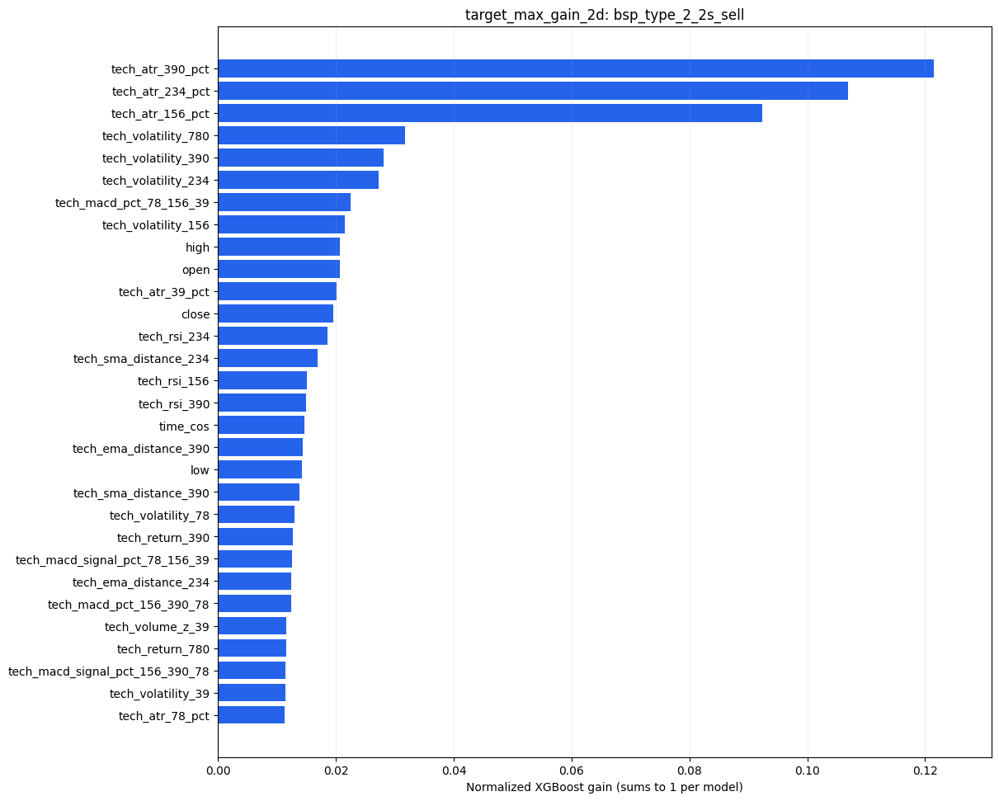

...

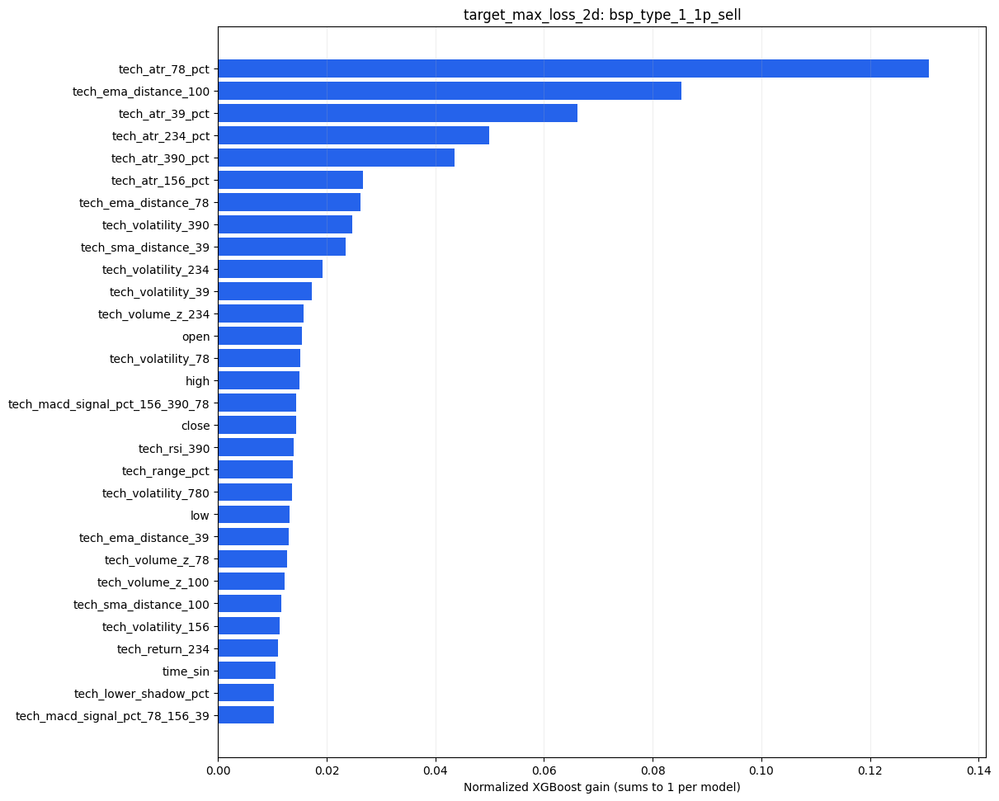

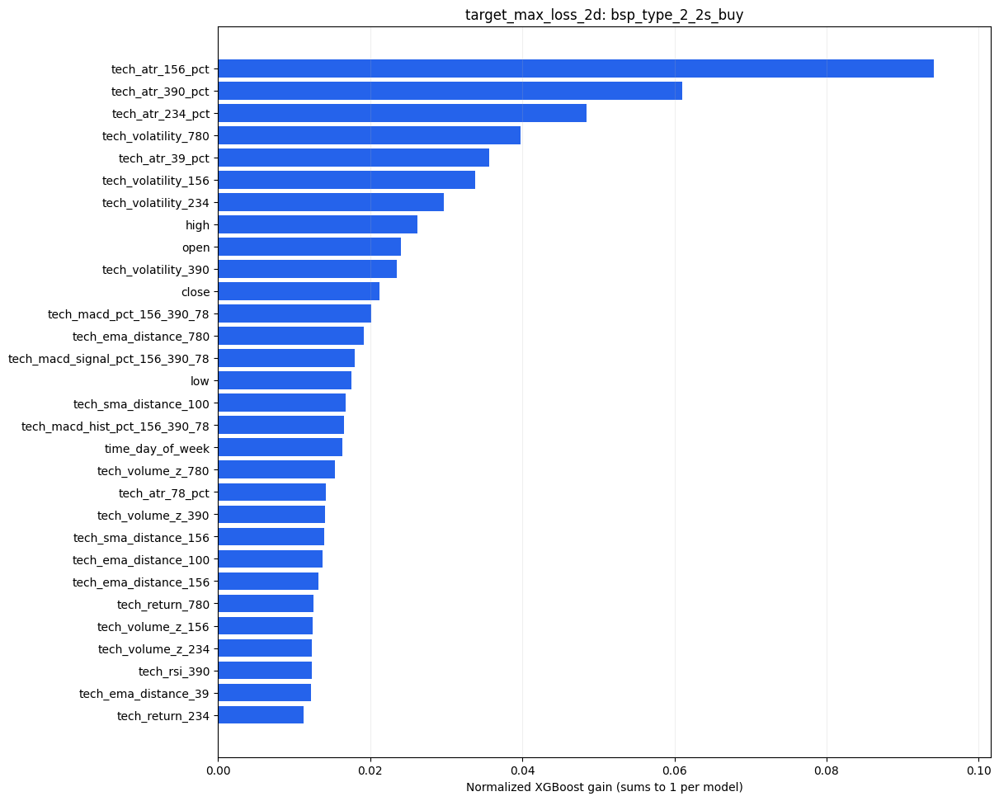

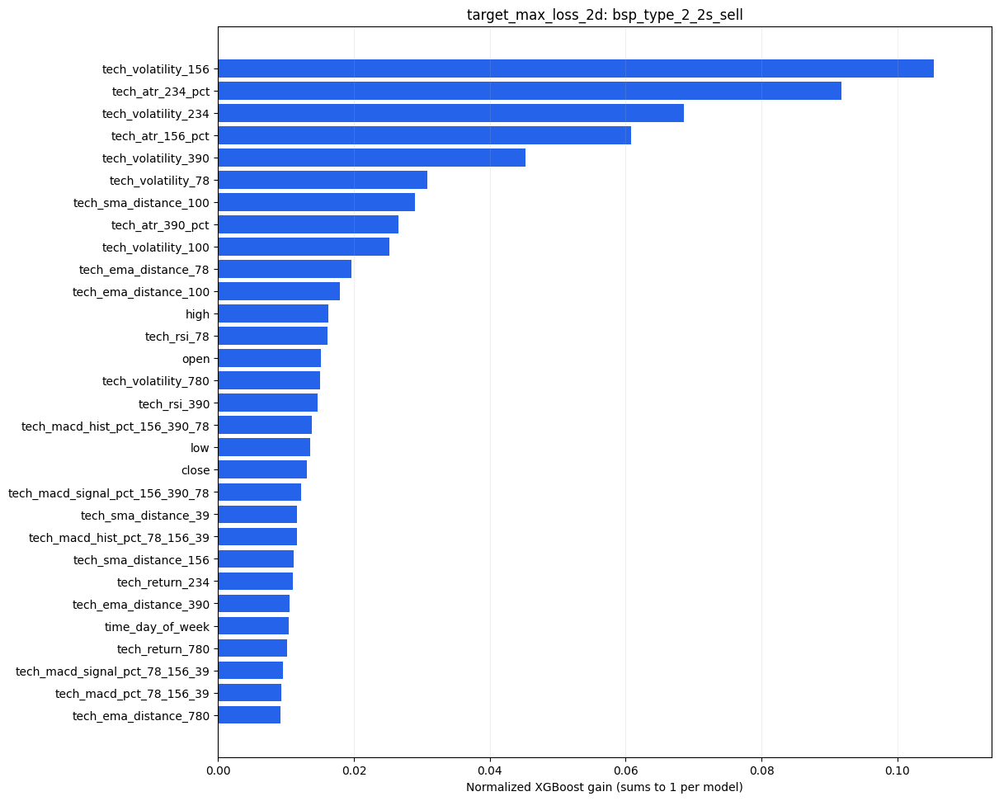

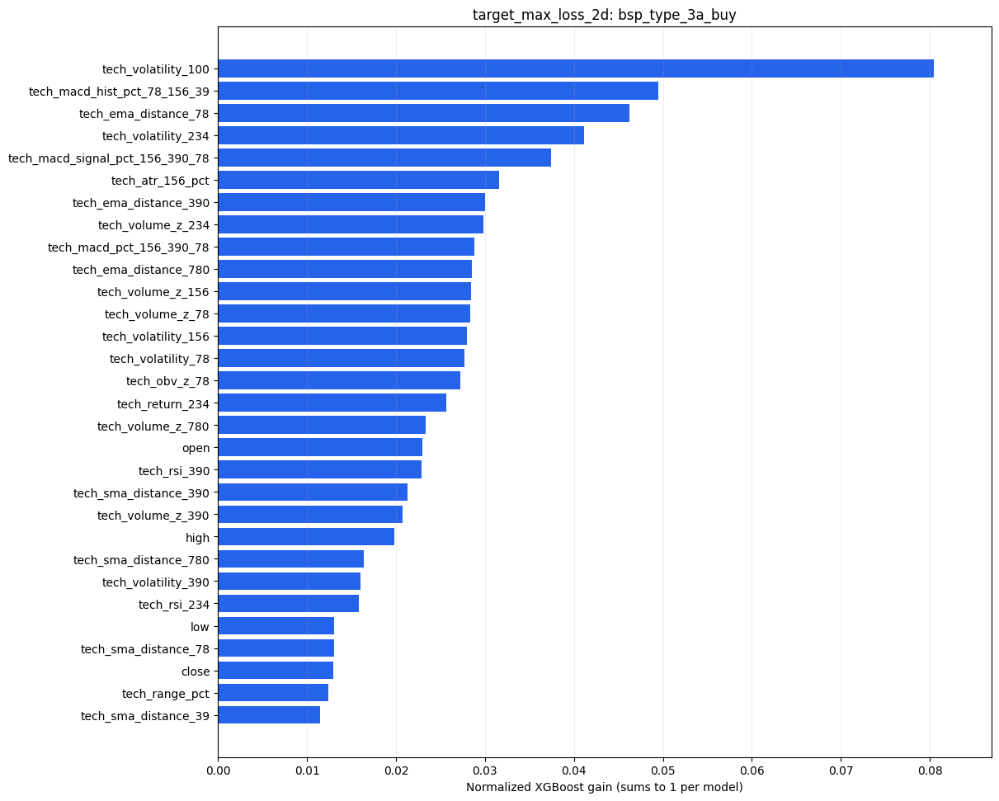

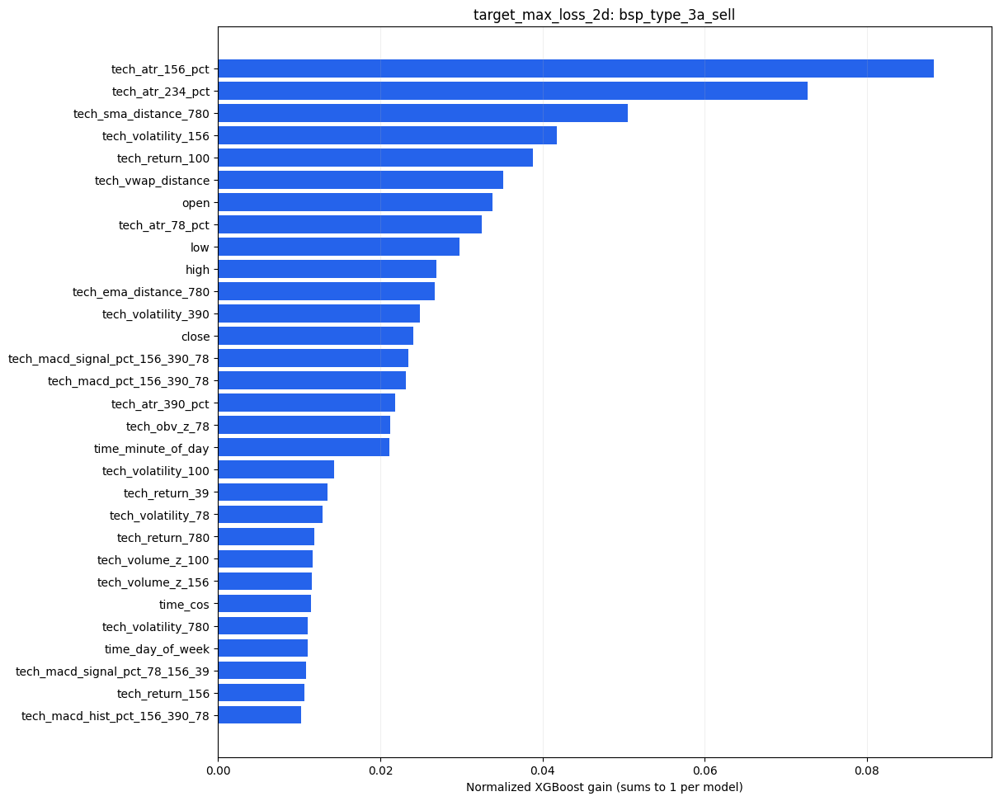

{'output_dir': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_bsp_buy_sell_importance',
 'metrics': {'models': {'all_5min_technical': {'rows': {'train': 223852,
     'validation': 24579,
     'test': 46740},
    'targets': {'target_max_gain_2d': {'train': {'rows': 223852,
       'mae': 0.017407630522334128,
       'rmse': 0.023286148779727085,
       'r2': 0.5719092428303765},
      'validation': {'rows': 24579,
       'mae': 0.030090437358245334,
       'rmse': 0.041966814520389285,
       'r2': -0.01820706531718086},
      'test': {'rows': 46740,
       'mae': 0.021196491535301922,
       'rmse': 0.027126098461981937,
       'r2': 0.13993555596570906}},
     'target_max_loss_2d': {'train': {'rows': 223852,
       'mae': 0.022187375358772566,
       'rmse': 0.03043093006502739,
       'r2': 0.4959142759299874},
      'validation': {'rows': 24579,
       'mae': 0.058339358417078005,
       'rmse': 0.07230921757678464,
       'r2': -1.40614661419824},
      'test': {'rows': 467

In [9]:
import importlib

import kline_2day_forecaster.comparison
import kline_2day_forecaster

importlib.reload(
    kline_2day_forecaster.comparison
)

kline_2day_forecaster = importlib.reload(
    kline_2day_forecaster
)

from kline_2day_forecaster import (
    ForecastConfig,
    compare_chan_bsp_feature_importance,
)


config = ForecastConfig(
    input_csv="DataAPI/data/TQQQ_5M.csv",

    output_dir=(
        "outputs/"
        "tqqq_bsp_buy_sell_importance"
    ),

    symbol="TQQQ",

    enable_chan=False,
    use_chan_bsp_features=False,

    # 下一根K线开始，到第2个后续交易日相同时刻
    horizon_days=2,

    technical_windows=(
        39,
        78,
        100,
        156,
        234,
        390,
        780,
    ),

    technical_rsi_periods=(
        39,
        78,
        156,
        234,
        390,
    ),

    technical_atr_periods=(
        39,
        78,
        156,
        234,
        390,
    ),

    technical_macd_periods=(
        (78, 156, 39),
        (156, 390, 78),
    ),

    verbose=True,
    progress_every_rows=2_500,
)


comparison_result = (
    compare_chan_bsp_feature_importance(
        config,

        bspoint_path=(
            "outputs/"
            "bsp_trade_labels_TQQQ_5m_"
            "2012-2026_training.csv"
        ),

        # BSP实际所在K线
        bsp_timestamp_column="bsp_timestamp",

        # CSV中的买卖方向字段
        bsp_direction_column="direction",

        # 分开训练buy和sell
        separate_bsp_directions=True,

        # 保留Open/High/Low/Close/Volume
        include_raw_ohlcv=True,

        output_dir=(
            "outputs/"
            "tqqq_bsp_buy_sell_importance"
        ),

        train_start_date="2014-01-01",
        train_end_date="2020-12-31",

        test_start_date="2021-01-01",
        test_end_date="2021-12-30",

        bsp_types=(
            "1",
            "1p",
            "2",
            "2s",
            "3a",
        ),

        bsp_type_groups={
            "type_1_1p": (
                "1",
                "1p",
            ),

            "type_2_2s": (
                "2",
                "2s",
            ),

            "type_3a": (
                "3a",
            ),
        },

        validation_fraction=0.10,

        # Type 3a buy验证集约93个唯一时间点，
        # 因此不能继续使用100，否则会被跳过。
        minimum_rows_per_split=75,

        top_features=30,

        xgboost_params={
            "n_estimators": 300,
            "max_depth": 4,
            "learning_rate": 0.02,
            "min_child_weight": 30,
            "subsample": 0.65,
            "colsample_bytree": 0.50,
            "reg_alpha": 1.0,
            "reg_lambda": 20.0,
        },

        show=True,
        verbose=True,
    )
)

comparison_result

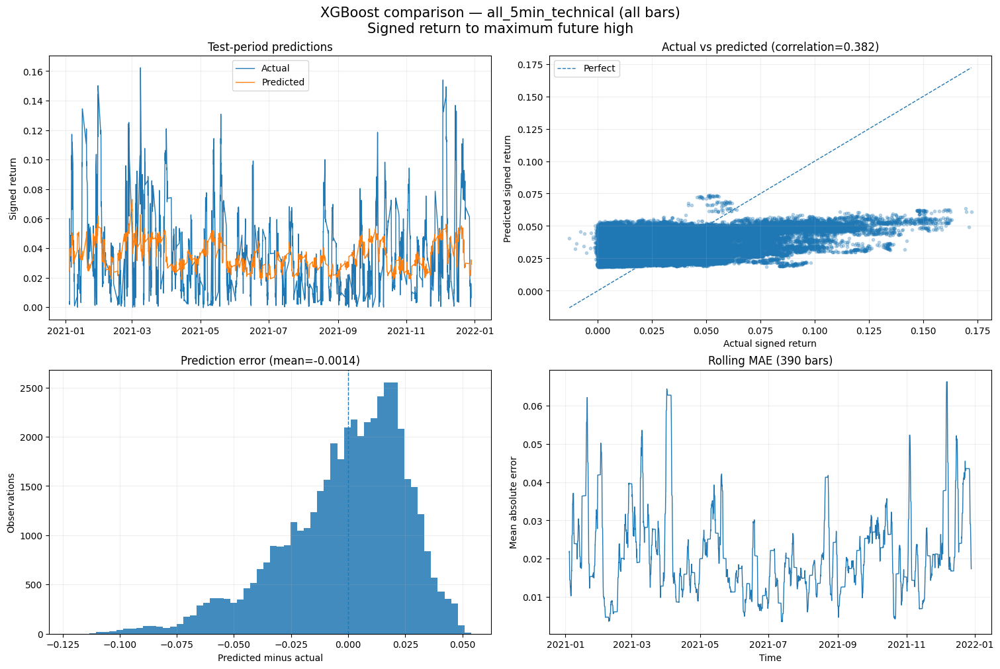

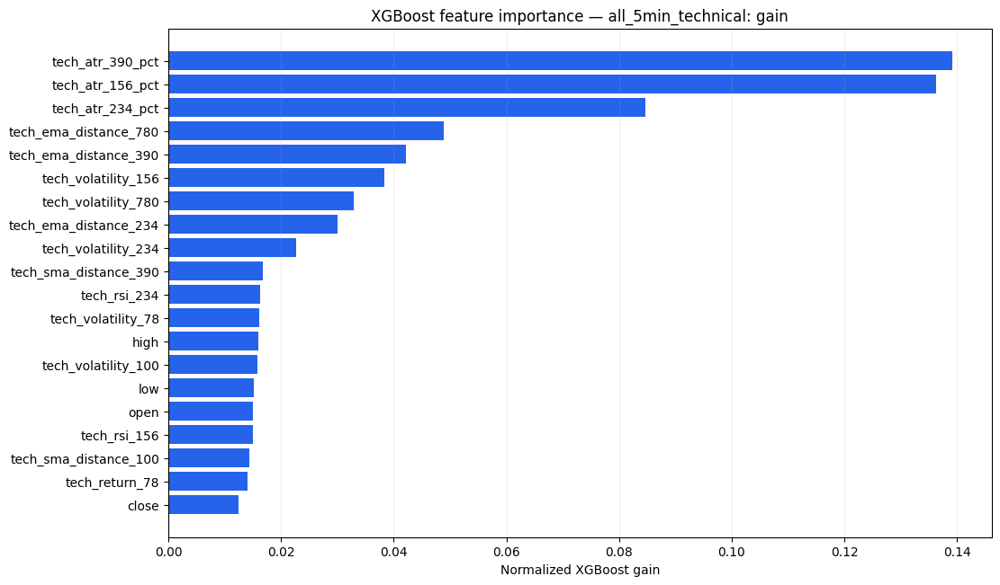

In [ ]:
import importlib

import kline_2day_forecaster.evaluation
import kline_2day_forecaster

# 先reload子模块
importlib.reload(
    kline_2day_forecaster.evaluation
)

kline_2day_forecaster = importlib.reload(
    kline_2day_forecaster
)

from kline_2day_forecaster import (
    plot_bsp_comparison_results,
)


plot_paths = plot_bsp_comparison_results(
    output_dir=(
        "outputs/"
        "tqqq_bsp_buy_sell_importance"
    ),

    # None表示绘制所有cohort
    cohorts=None,

    # 对all_5min而言是390根K线；
    # 对BSP cohort而言是390个BSP信号
    rolling_bars=390,

    # 限制时间序列图中显示的数据点数量
    max_time_points=2_000,

    # 每个模型显示前20个重要特征
    top_features=20,

    show=True,
)

plot_paths

[Comparison] Building one shared OHLCV + technical K-line dataset
[Data] Loading DataAPI/data/TQQQ_5M.csv
[Data] Loaded 609,449 normalized rows: 2010-02-11 09:40:00 to 2026-06-12 19:55:00
[Data] Working period including warm-up: 2013-12-18 12:10:00 to 2022-01-03 19:55:00 (298,802 rows)
[Features] Calculating causal price/volume technical features
[Chan] Disabled
[Labels] Building targets through the same time 2 trading sessions later
[Data] Dataset ready: 298,802 rows, 82 columns, 297,030 labeled | 2.4s
[Comparison] all_5min_technical: {'train': 223852, 'validation': 24579, 'test': 46740}, features=71
[Comparison] bsp_type_1_1p_buy: {'train': 5057, 'validation': 377, 'test': 889}, features=71
[Comparison] other_klines_not_type_1_1p_buy: {'train': 218795, 'validation': 24202, 'test': 45851}, features=71
[Comparison] bsp_type_1_1p_sell: {'train': 8894, 'validation': 885, 'test': 1751}, features=71
[Comparison] other_klines_not_type_1_1p_sell: {'train': 214958, 'validation': 23694, 'test'

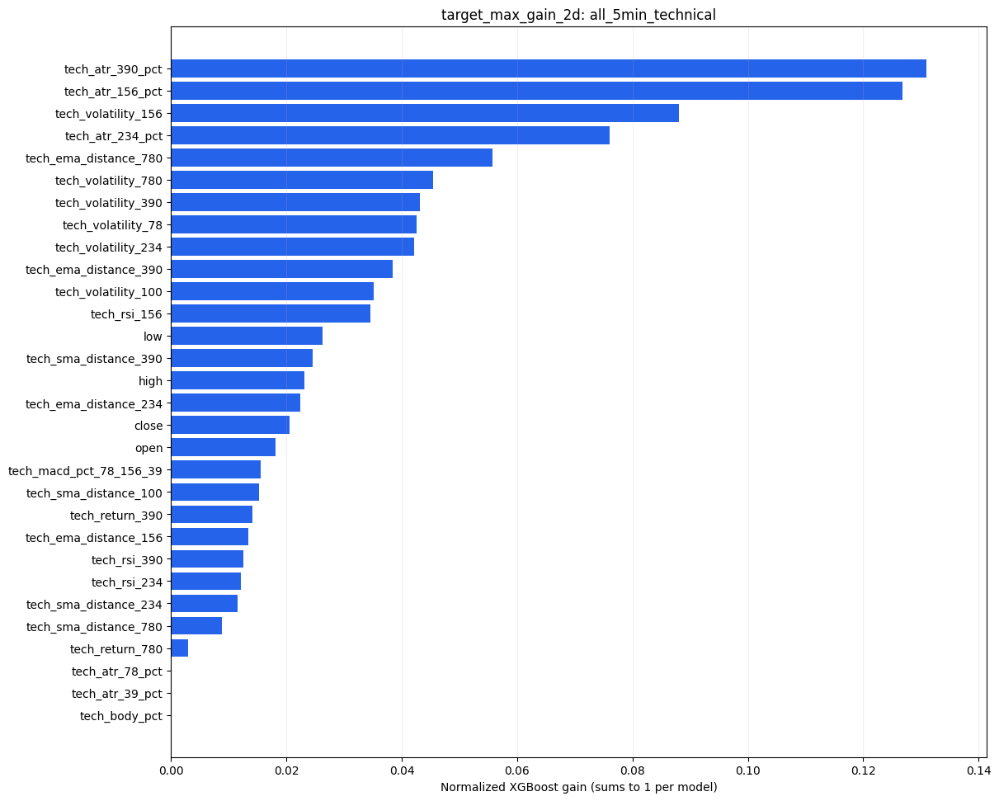

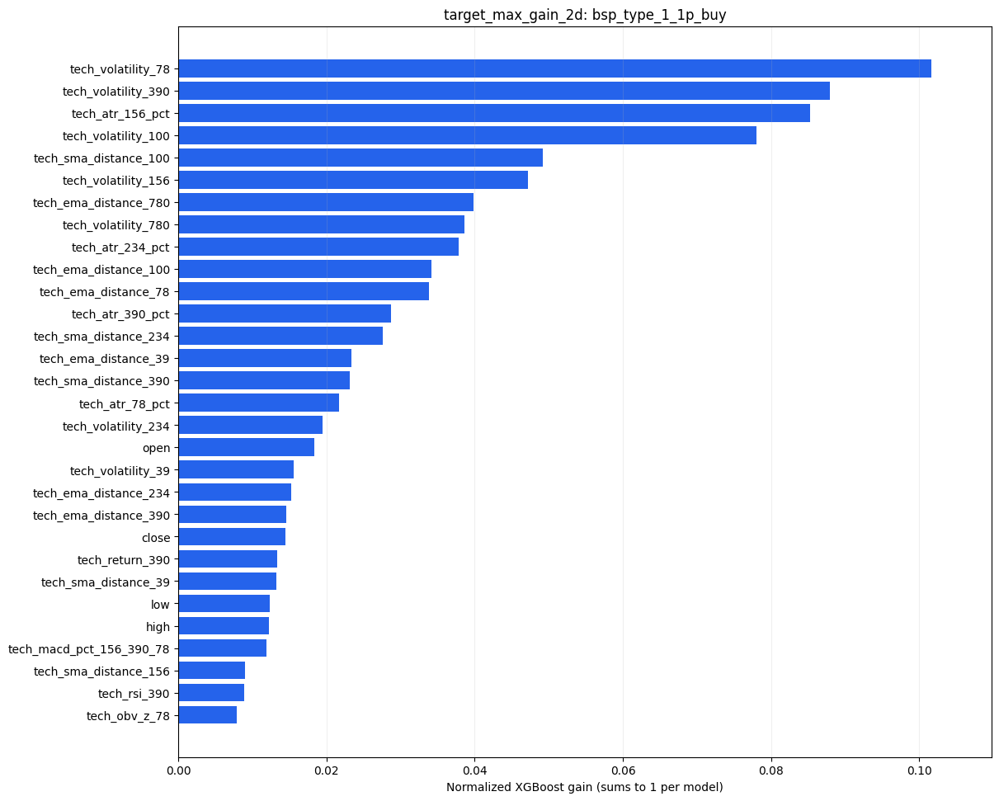

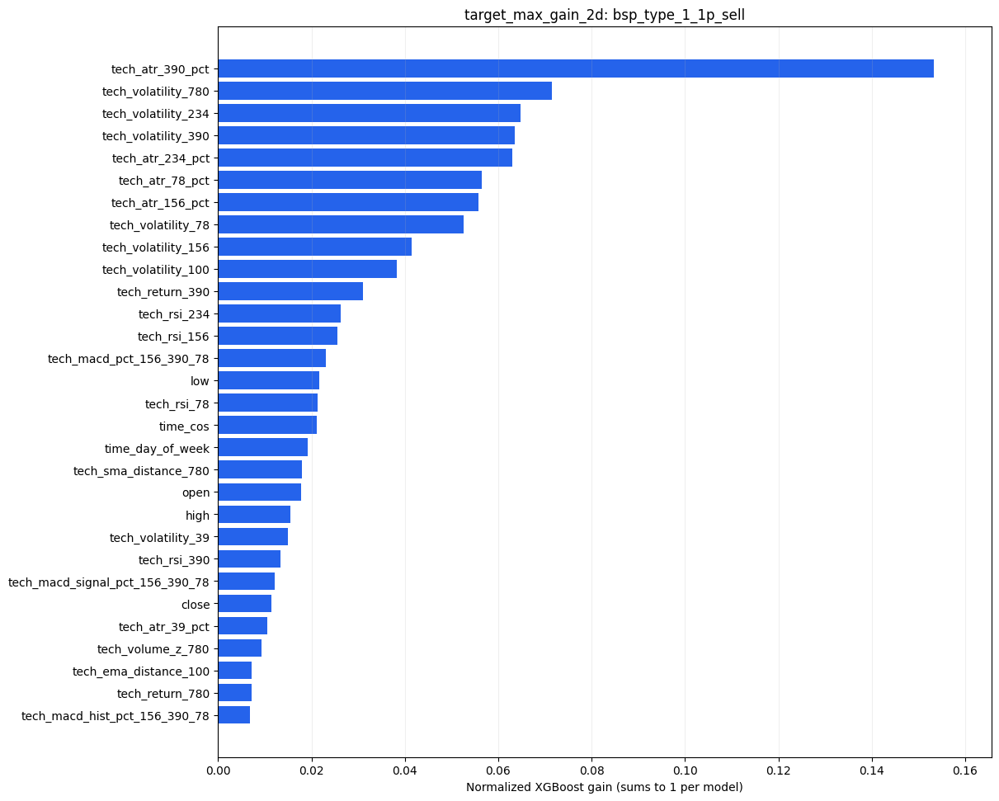

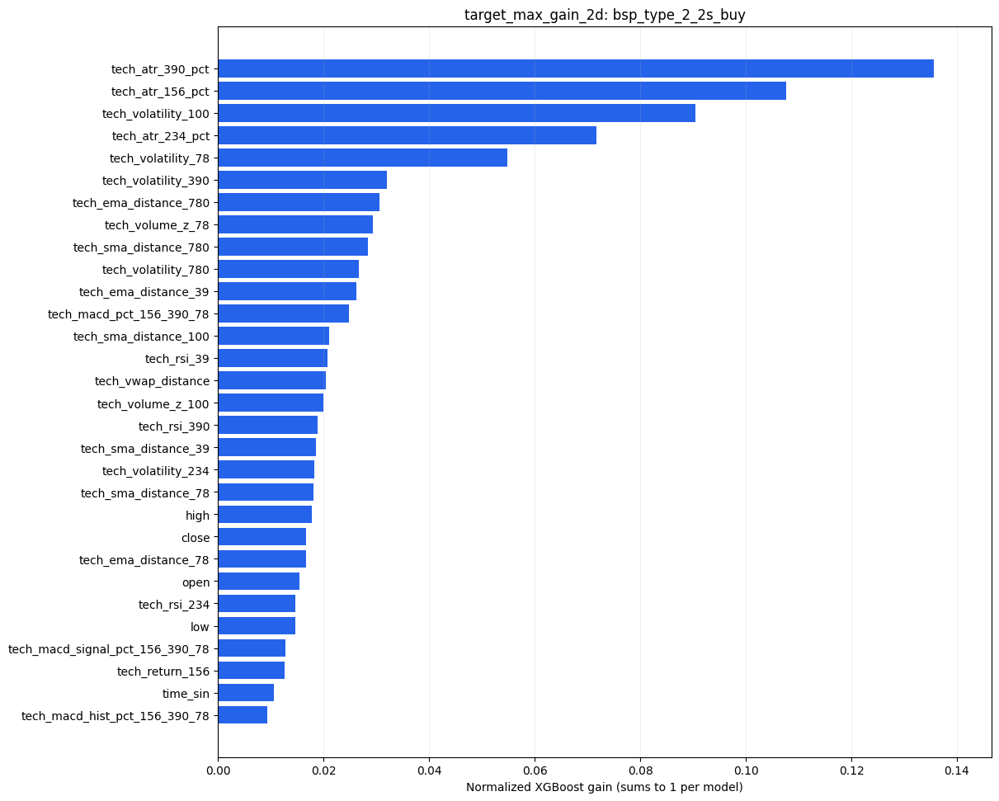

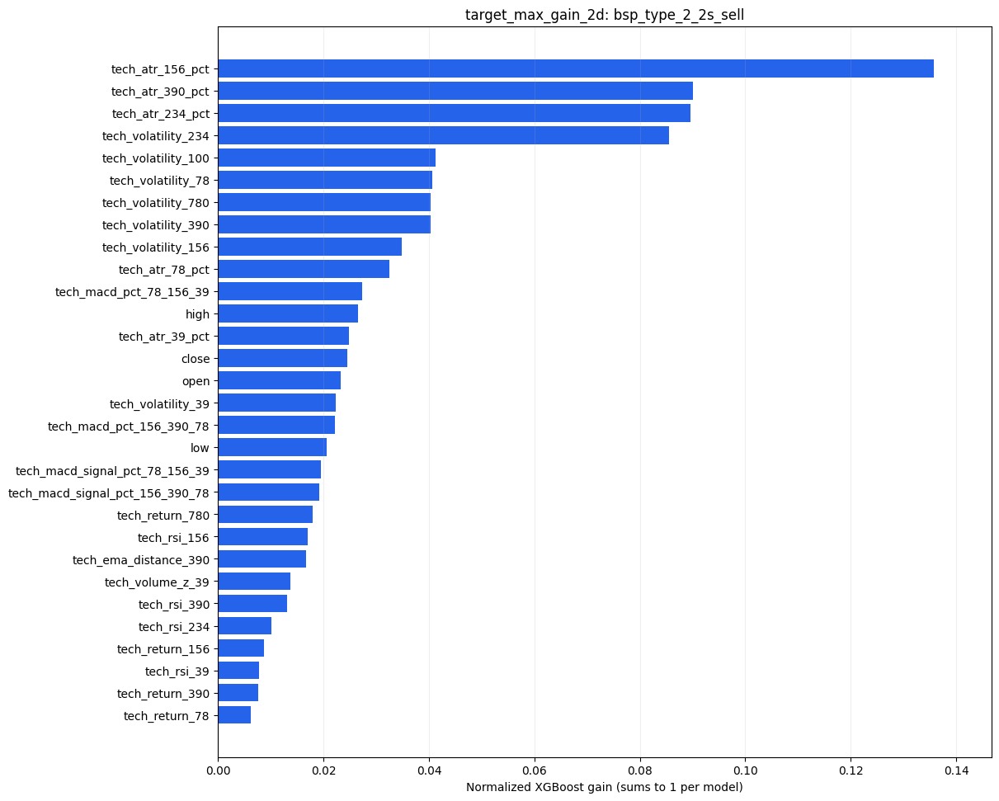

...

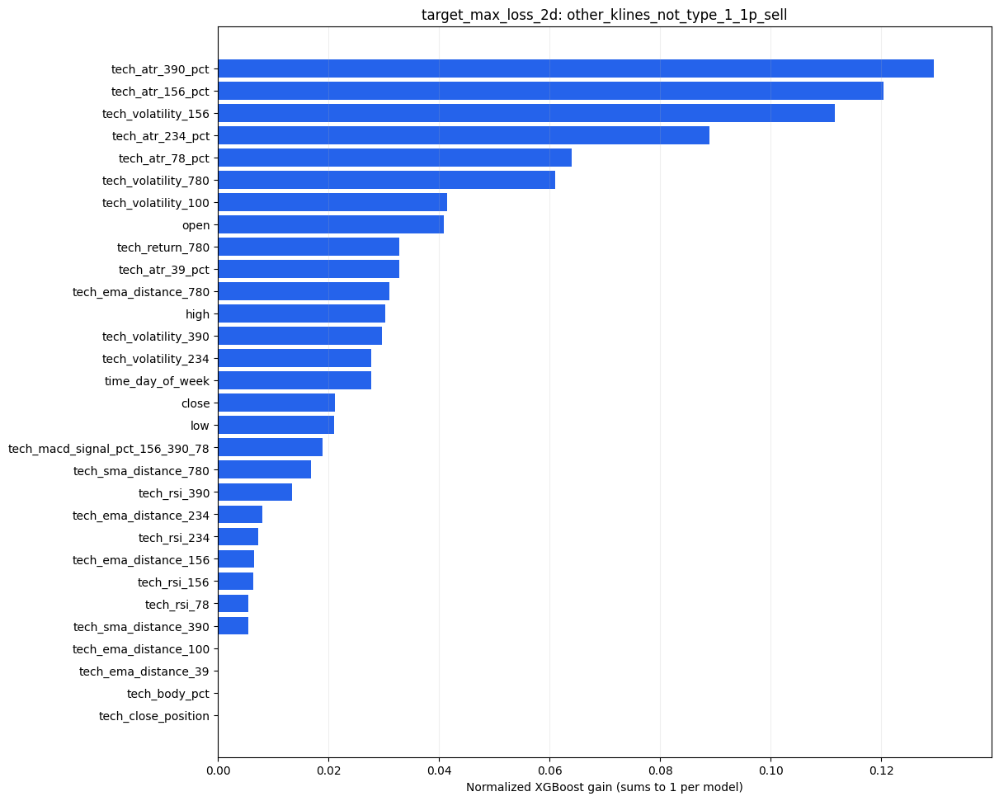

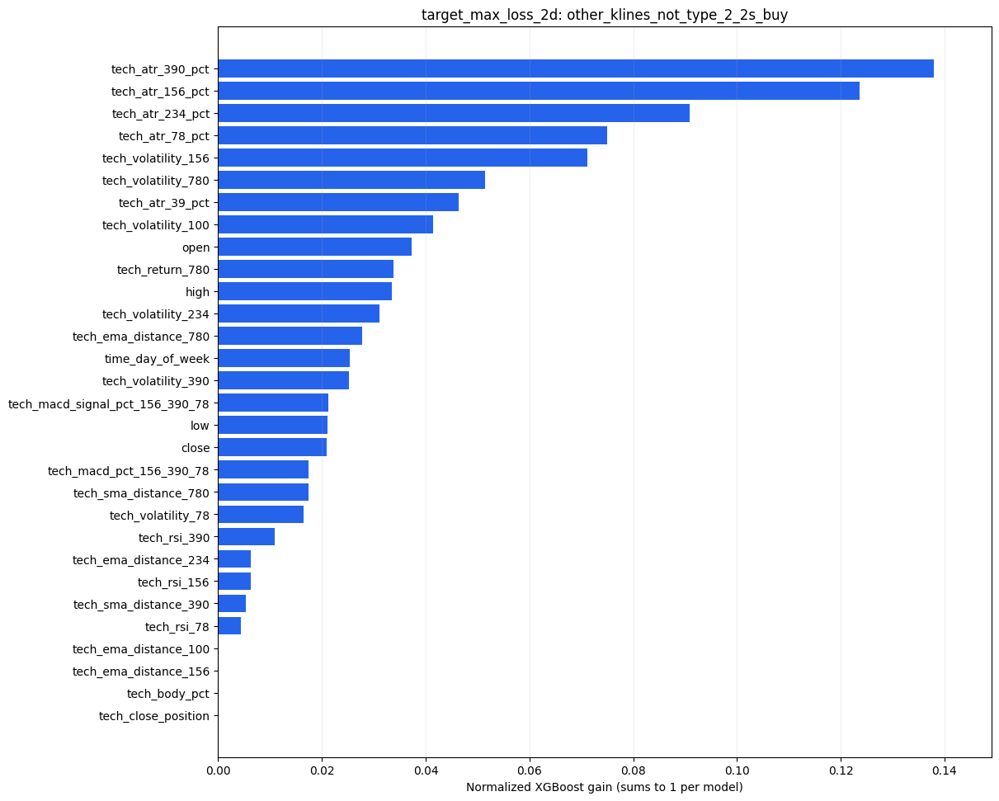

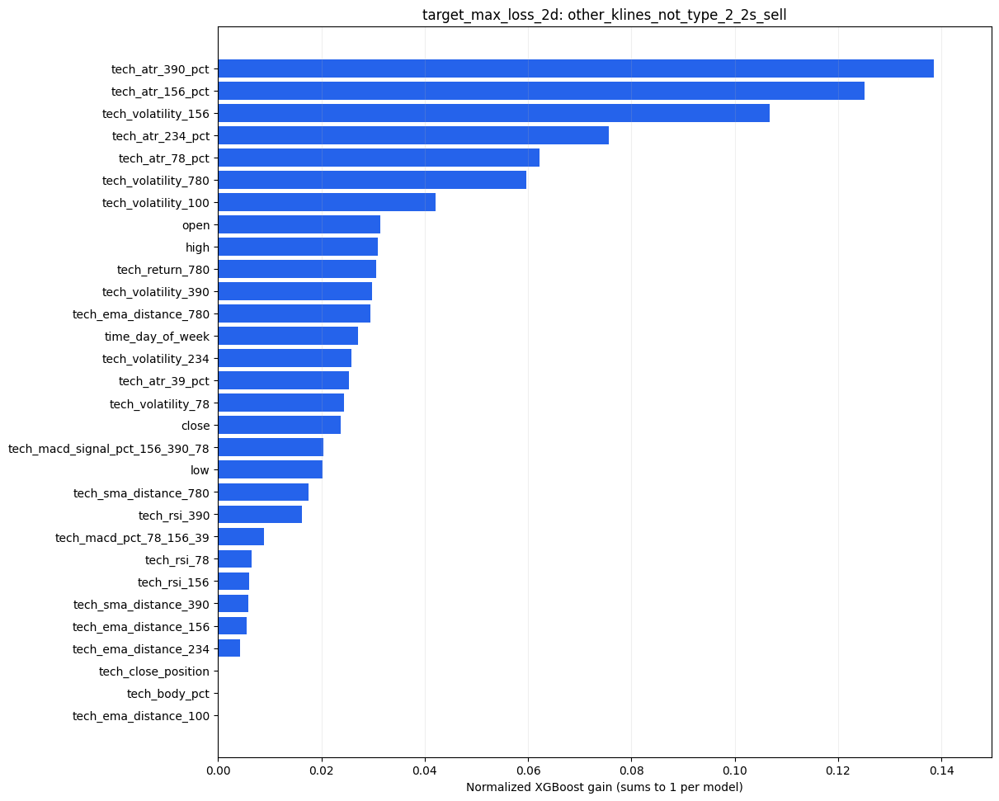

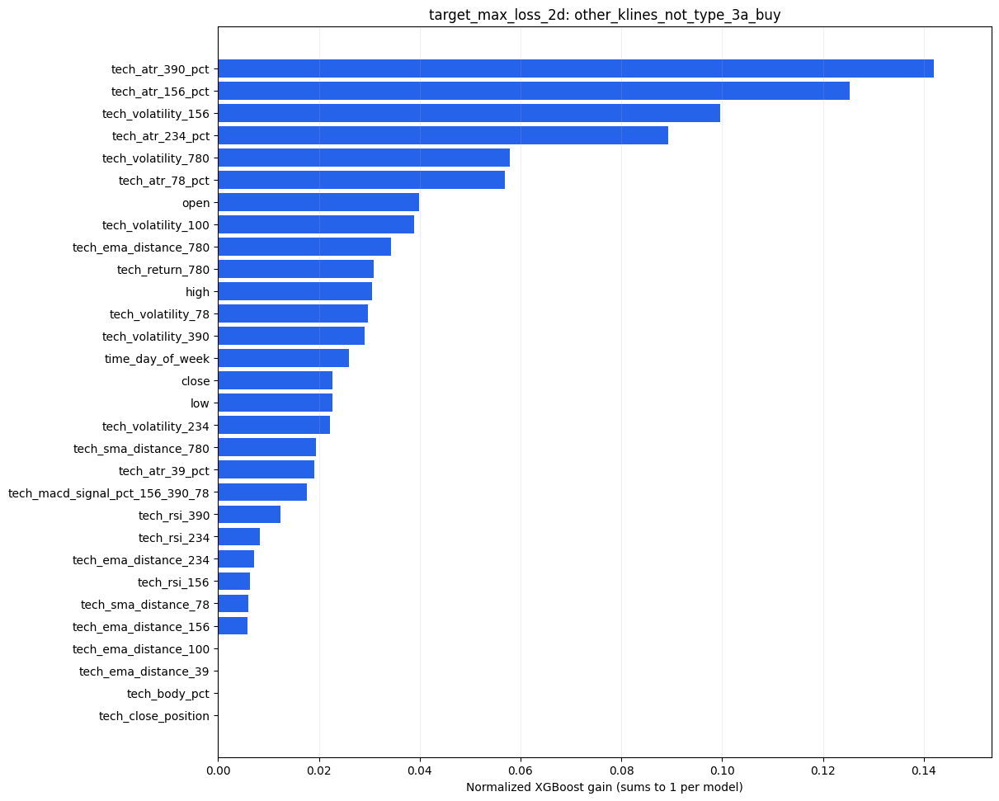

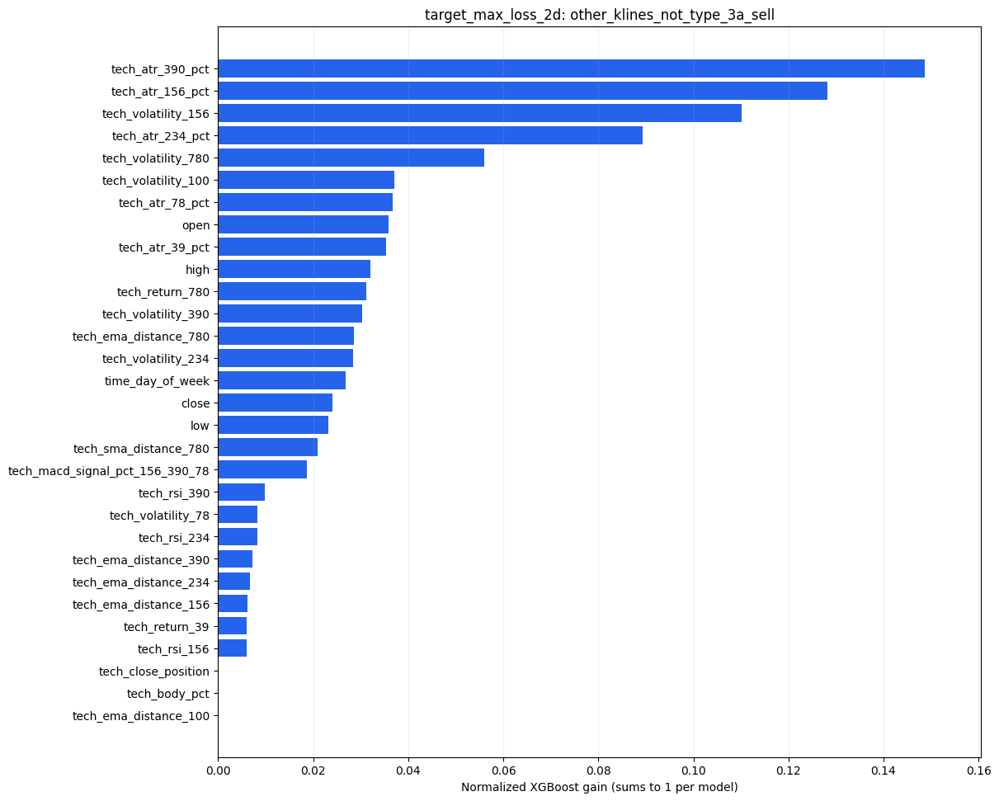

{'output_dir': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_bsp_vs_other_klines',
 'metrics': {'models': {'all_5min_technical': {'rows': {'train': 223852,
     'validation': 24579,
     'test': 46740},
    'targets': {'target_max_gain_2d': {'train': {'rows': 223852,
       'mae': 0.019669094857452777,
       'rmse': 0.02728559985678815,
       'r2': 0.41222984923966943},
      'validation': {'rows': 24579,
       'mae': 0.029646672251940332,
       'rmse': 0.04177467522811615,
       'r2': -0.008904966158529204},
      'test': {'rows': 46740,
       'mae': 0.020339998299188203,
       'rmse': 0.02622353092783861,
       'r2': 0.19621728625912382}},
     'target_max_loss_2d': {'train': {'rows': 223852,
       'mae': 0.025151935273175312,
       'rmse': 0.03568713416842001,
       'r2': 0.30673816314963864},
      'validation': {'rows': 24579,
       'mae': 0.0349338755775238,
       'rmse': 0.04619279031020277,
       'r2': 0.018064059846029767},
      'test': {'rows': 46740,

In [6]:
import importlib

import kline_2day_forecaster.comparison
import kline_2day_forecaster

importlib.reload(
    kline_2day_forecaster.comparison
)

kline_2day_forecaster = importlib.reload(
    kline_2day_forecaster
)

from kline_2day_forecaster import (
    ForecastConfig,
    compare_bsp_type_vs_other_klines,
)


config = ForecastConfig(
    input_csv="DataAPI/data/TQQQ_5M.csv",

    output_dir=(
        "outputs/"
        "tqqq_bsp_vs_other_klines"
    ),

    symbol="TQQQ",

    enable_chan=False,
    use_chan_bsp_features=False,
    horizon_days=2,

    technical_windows=(
        39,
        78,
        100,
        156,
        234,
        390,
        780,
    ),

    technical_rsi_periods=(
        39,
        78,
        156,
        234,
        390,
    ),

    technical_atr_periods=(
        39,
        78,
        156,
        234,
        390,
    ),

    technical_macd_periods=(
        (78, 156, 39),
        (156, 390, 78),
    ),

    verbose=True,
    progress_every_rows=2_500,
)


comparison_result = (
    compare_bsp_type_vs_other_klines(
        config,

        bspoint_path=(
            "outputs/"
            "bsp_trade_labels_TQQQ_5m_"
            "2012-2026_training.csv"
        ),

        bsp_timestamp_column="bsp_timestamp",
        bsp_direction_column="direction",

        separate_bsp_directions=True,
        include_raw_ohlcv=True,

        output_dir=(
            "outputs/"
            "tqqq_bsp_vs_other_klines"
        ),

        train_start_date="2014-01-01",
        train_end_date="2020-12-31",

        test_start_date="2021-01-01",
        test_end_date="2021-12-30",

        bsp_types=(
            "1",
            "1p",
            "2",
            "2s",
            "3a",
        ),

        bsp_type_groups={
            "type_1_1p": (
                "1",
                "1p",
            ),

            "type_2_2s": (
                "2",
                "2s",
            ),

            "type_3a": (
                "3a",
            ),
        },

        validation_fraction=0.10,
        minimum_rows_per_split=75,
        top_features=30,

        xgboost_params={
            "n_estimators": 150,
            "max_depth": 2,
            "learning_rate": 0.02,
            "min_child_weight": 30,
            "subsample": 0.65,
            "colsample_bytree": 0.50,
            "reg_alpha": 1.0,
            "reg_lambda": 20.0,
        },

        show=True,
        verbose=True,
    )
)

comparison_result

In [7]:
from kline_2day_forecaster import (
    create_paired_bsp_model_predictions,
)


paired_result = (
    create_paired_bsp_model_predictions(
        output_dir=(
            "outputs/"
            "tqqq_bsp_vs_other_klines"
        ),

        # None means all BSP-specific cohorts.
        cohorts=None,
    )
)

paired_result

{'output_dir': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_bsp_vs_other_klines\\paired_bsp_predictions',
 'paired_prediction_paths': {'bsp_type_1_1p_buy': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_bsp_vs_other_klines\\paired_bsp_predictions\\bsp_type_1_1p_buy_paired_predictions.csv',
  'bsp_type_1_1p_sell': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_bsp_vs_other_klines\\paired_bsp_predictions\\bsp_type_1_1p_sell_paired_predictions.csv',
  'bsp_type_2_2s_buy': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_bsp_vs_other_klines\\paired_bsp_predictions\\bsp_type_2_2s_buy_paired_predictions.csv',
  'bsp_type_2_2s_sell': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_bsp_vs_other_klines\\paired_bsp_predictions\\bsp_type_2_2s_sell_paired_predictions.csv',
  'bsp_type_3a_buy': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_bsp_vs_other_klines\\paired_bsp_predictions\\bsp_type_3a_buy_paired_predictions.csv',
  'bsp_type_3a_sell':

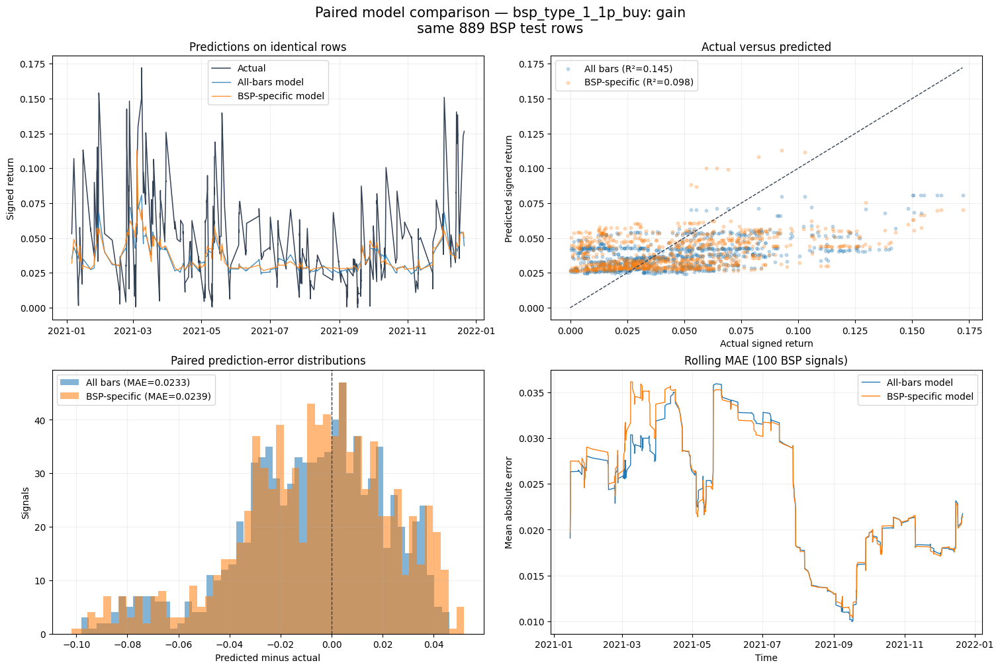

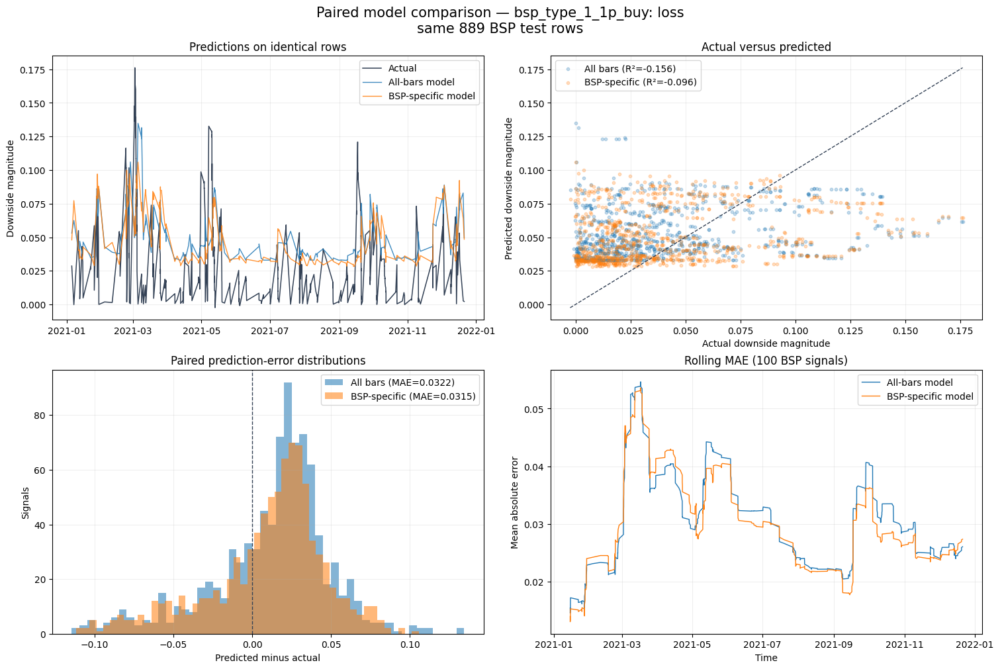

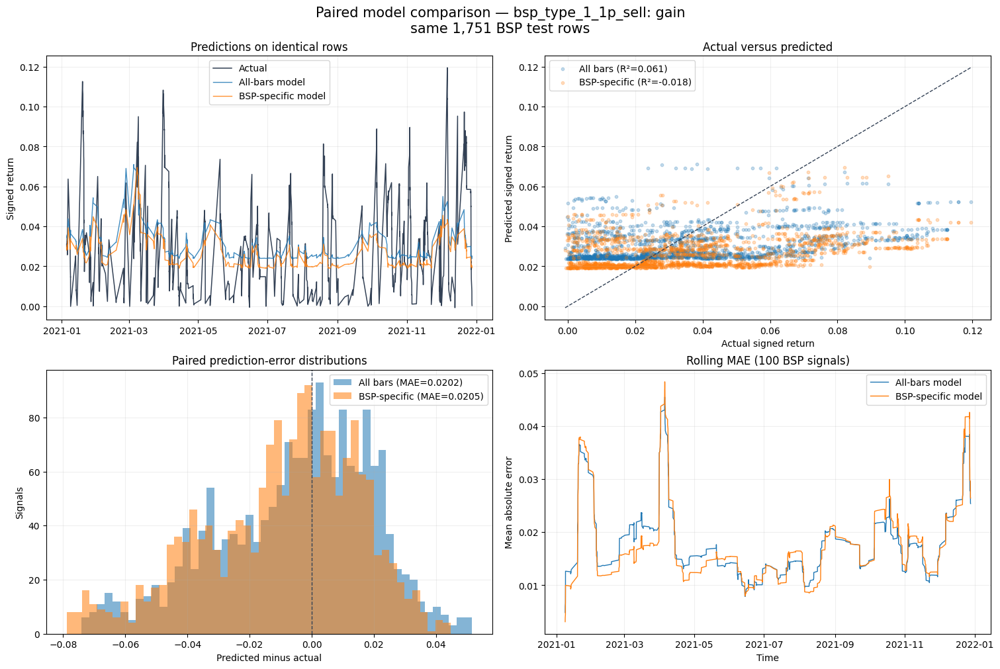

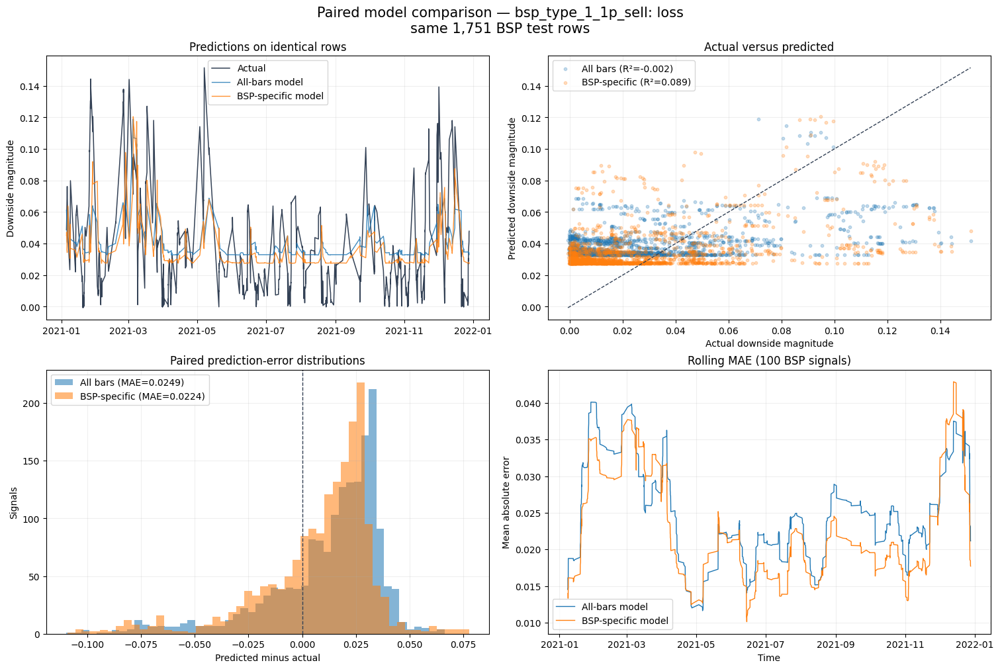

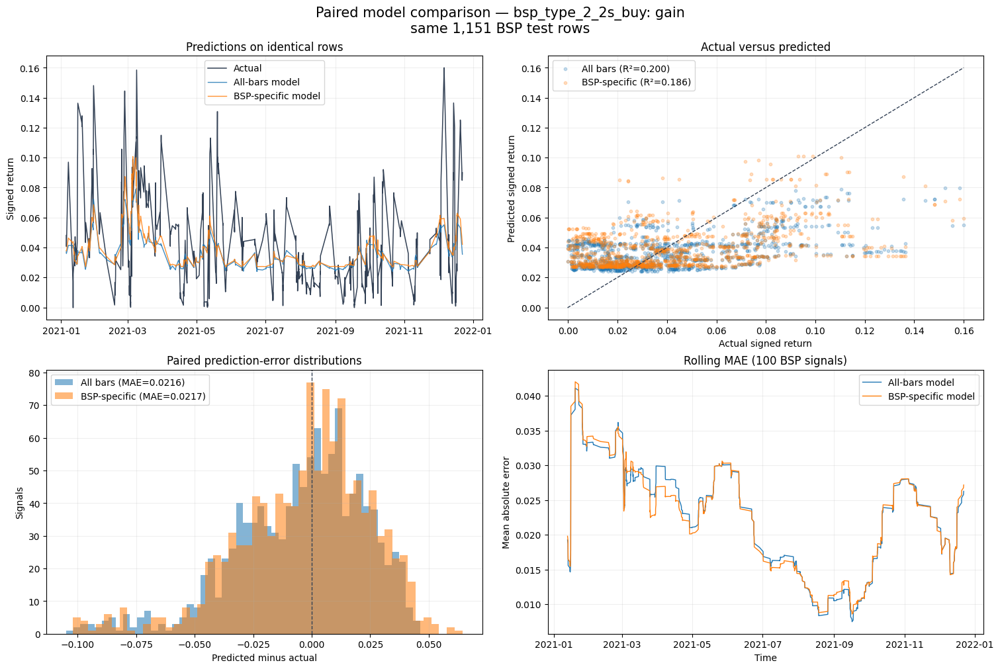

...

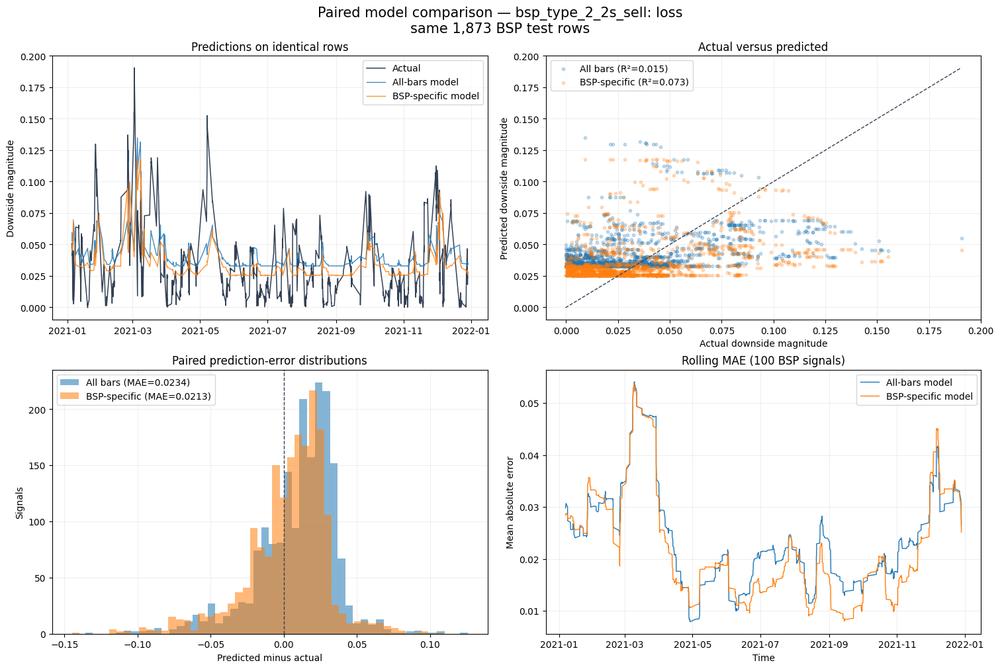

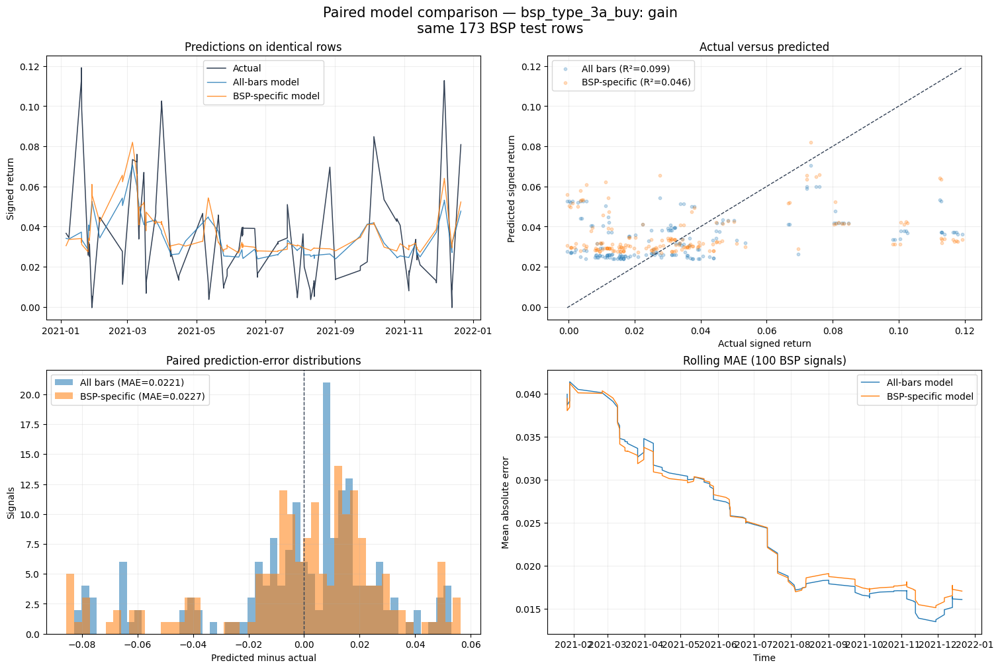

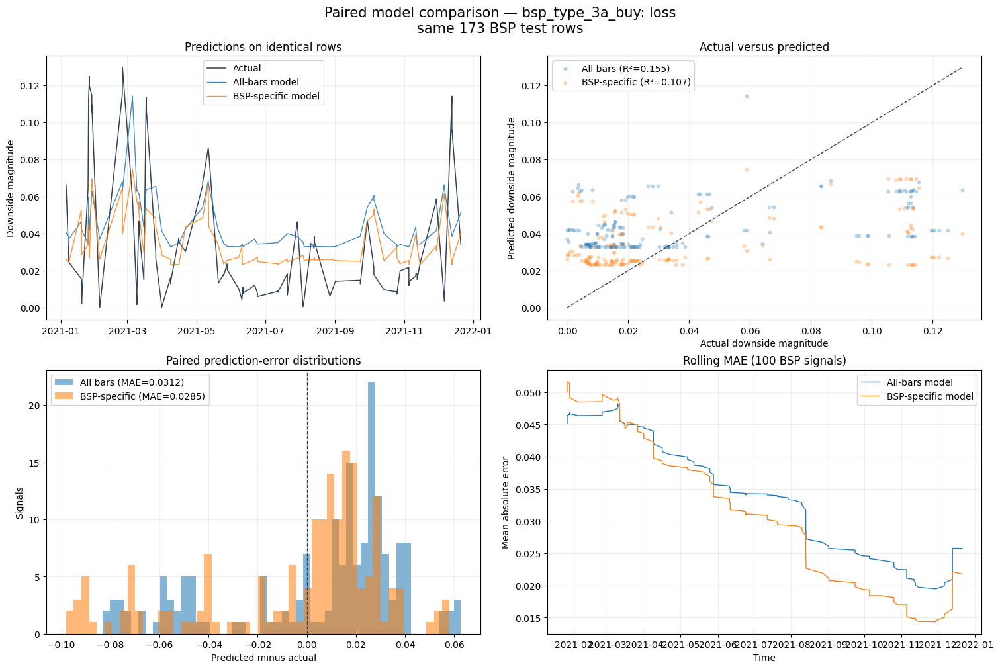

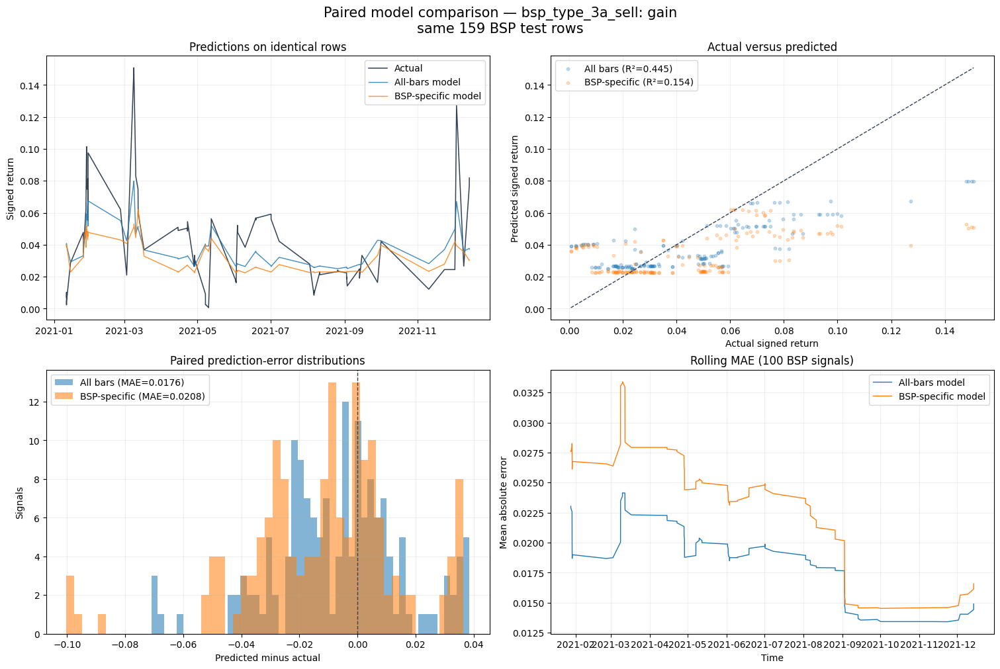

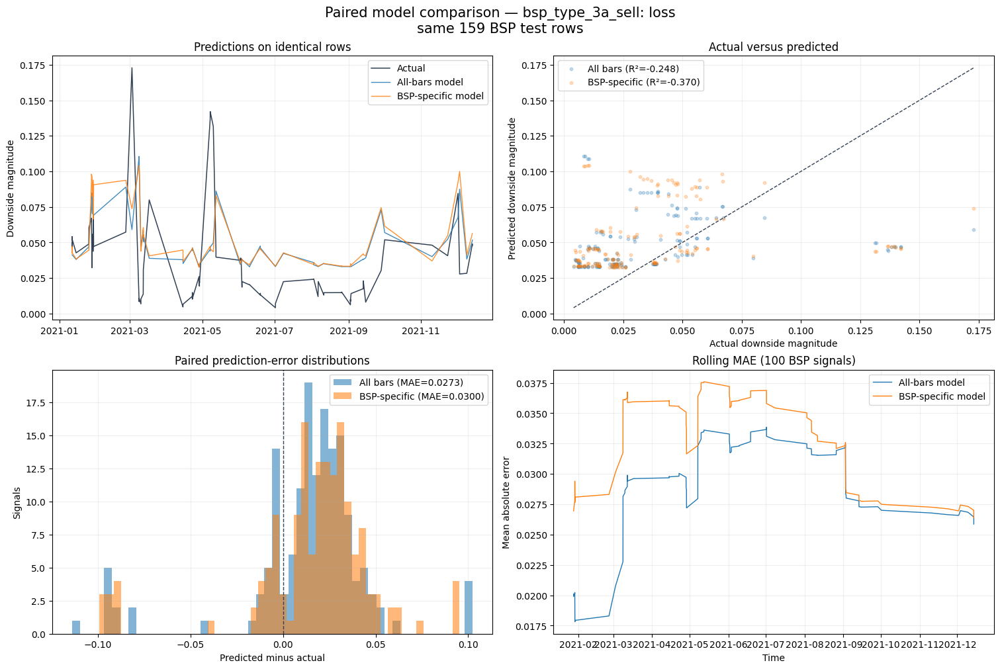

{'bsp_type_1_1p_buy_gain': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_bsp_vs_other_klines\\plots\\paired_model_comparison\\bsp_type_1_1p_buy_gain_paired_comparison.png',
 'bsp_type_1_1p_buy_loss': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_bsp_vs_other_klines\\plots\\paired_model_comparison\\bsp_type_1_1p_buy_loss_paired_comparison.png',
 'bsp_type_1_1p_sell_gain': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_bsp_vs_other_klines\\plots\\paired_model_comparison\\bsp_type_1_1p_sell_gain_paired_comparison.png',
 'bsp_type_1_1p_sell_loss': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_bsp_vs_other_klines\\plots\\paired_model_comparison\\bsp_type_1_1p_sell_loss_paired_comparison.png',
 'bsp_type_2_2s_buy_gain': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_bsp_vs_other_klines\\plots\\paired_model_comparison\\bsp_type_2_2s_buy_gain_paired_comparison.png',
 'bsp_type_2_2s_buy_loss': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqq

In [8]:
import importlib

import kline_2day_forecaster.evaluation
import kline_2day_forecaster

importlib.reload(
    kline_2day_forecaster.evaluation
)

kline_2day_forecaster = importlib.reload(
    kline_2day_forecaster
)

from kline_2day_forecaster import (
    plot_paired_bsp_model_results,
)


paired_plot_paths = (
    plot_paired_bsp_model_results(
        output_dir=(
            "outputs/"
            "tqqq_bsp_vs_other_klines"
        ),

        # None plots every BSP-specific cohort.
        cohorts=None,

        # Rolling window counts BSP signals, not 5-minute bars.
        rolling_signals=100,

        max_time_points=2_000,

        show=True,
    )
)

paired_plot_paths

In [2]:
import importlib
import kline_2day_forecaster

# Reload changed submodules in dependency order.
import kline_2day_forecaster.config
import kline_2day_forecaster.labels
import kline_2day_forecaster.features
import kline_2day_forecaster.chan_state
import kline_2day_forecaster.models
import kline_2day_forecaster.pipeline
import kline_2day_forecaster.inference

importlib.reload(kline_2day_forecaster.config)
importlib.reload(kline_2day_forecaster.labels)
importlib.reload(kline_2day_forecaster.features)
importlib.reload(kline_2day_forecaster.chan_state)
importlib.reload(kline_2day_forecaster.models)
importlib.reload(kline_2day_forecaster.pipeline)
importlib.reload(kline_2day_forecaster.inference)
importlib.reload(kline_2day_forecaster)

# Re-import public objects so notebook references use the reloaded classes/functions.
from kline_2day_forecaster import ForecastConfig, train_forecaster
from kline_2day_forecaster.inference import load_forecaster, predict_from_csv

In [5]:
config = ForecastConfig(
    input_csv="DataAPI/data/TQQQ_5M.csv",
    output_dir="outputs/tqqq_xgboost_next_day_exact_return",
    symbol="TQQQ",

    # target_mode="up_direction",
    target_mode="exact_return",
    horizon_days=1,
    enable_chan=False,
    use_standard_technical_features=True,

    regular_session_only=True,
    regular_session_start="09:30",
    regular_session_end="15:55",
    sample_every_minutes=30,

    # train_start_date="2016-01-01",
    # train_end_date="2021-12-31",

    # # validation_start_date="2022-01-01",
    # # validation_end_date="2022-12-31",

    # test_start_date="2023-01-01",
    # test_end_date="2023-12-31",

    #validation_fraction=0.10,  # Ignored when explicit validation dates are set.

    technical_windows=(
        6,    # 30 minutes
        12,   # 1 hour
        39,   # half session
        78,   # one session
        156,  # two sessions
        390,  # one week
    ),

    technical_rsi_periods=(12, 39, 78, 156),
    technical_atr_periods=(12, 39, 78, 156),

    technical_macd_periods=(
        (12, 26, 9),
        (39, 78, 20),
        (78, 156, 39),
    ),

    technical_stochastic_period=39,
    technical_stochastic_d_period=10,
    technical_williams_period=39,
    technical_cci_period=78,
    technical_mfi_period=39,
    technical_bollinger_period=78,
    technical_dmi_period=39,
    technical_adx_period=20,
    technical_rsl_period=39,
    technical_ppo_periods=(39, 78),

    technical_first_hour_minutes=60,

    technical_relative_volume_lookback_days=20,
    technical_relative_volume_min_days=5,
)

In [8]:
result = train_forecaster(
    config,

    model_types=("xgboost",),
    prediction_model="xgboost",

    train_start_date="2018-01-01",
    train_end_date="2019-12-31",

    # Previously examined 2023 becomes validation.
    # validation_start_date="2023-01-01",
    # validation_end_date="2023-05-31",

    # # Fresh test period.
    test_start_date="2023-01-01",
    test_end_date="2023-12-31",
    validation_fraction=0.20,

    regular_session_only=True,
    sample_every_minutes=15,

    xgboost_params={
        "n_estimators": 300,
        "max_depth": 5,
        "learning_rate": 0.01,
        "subsample": 0.65,
        "colsample_bytree": 0.50,
        "min_child_weight": 200,
        "reg_alpha": 1.0,
        "reg_lambda": 20.0,
        "n_jobs": 1,
    },

    verbose=True,
)

[Run] Models=('xgboost',); default prediction=xgboost
[Run] Standard technical features=enabled; Chan features=disabled; Chan BSP features=enabled
[Run] Train=2018-01-01 to 2019-12-31; validation=last 20% to training end; test=2023-01-01 to 2023-12-31
[Data] Loading DataAPI/data/TQQQ_5M.csv
[Data] Loaded 609,449 normalized rows: 2010-02-11 09:40:00 to 2026-06-12 19:55:00
[Data] Working period including warm-up: 2017-12-26 08:00:00 to 2024-01-02 19:55:00 (274,462 rows)
[Features] Calculating causal price/volume technical features
[Chan] Disabled
[Labels] Building targets through the same time 1 trading sessions later
[Data] Dataset ready: 274,462 rows, 117 columns, 264,052 labeled | 3.7s
[Rows] Modeling observations=09:30-15:55, every 15 minutes
[Split] train=10,407, validation=2,609, test=6,500
[Features] Selected 101 stationary model features
[XGBoost] Training target_exact_return (300 trees, depth=5)
[XGBoost] target_exact_return complete in 1.3s | test MAE=0.026761, RMSE=0.034940, R

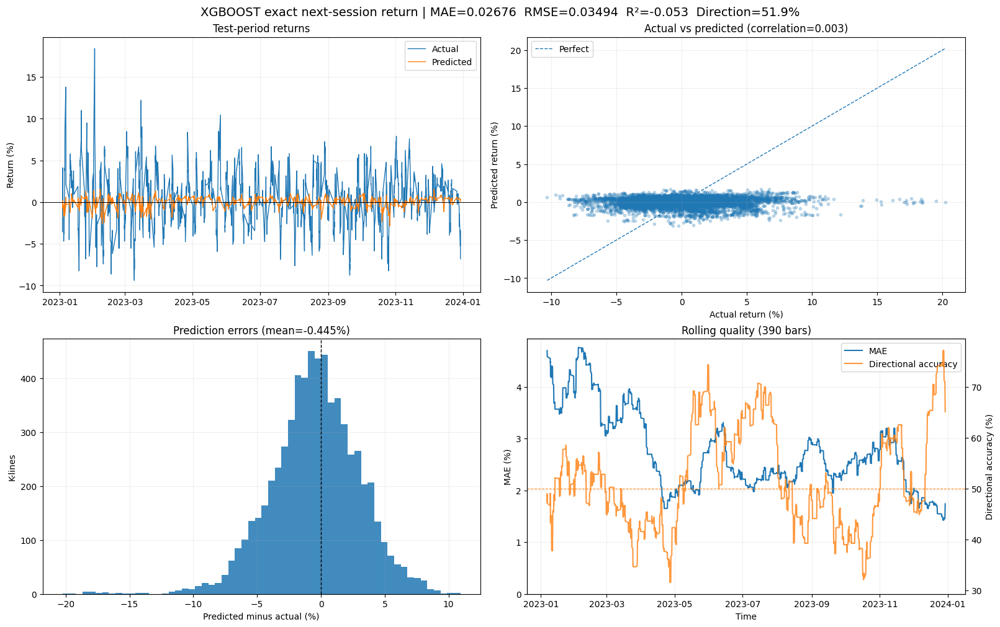

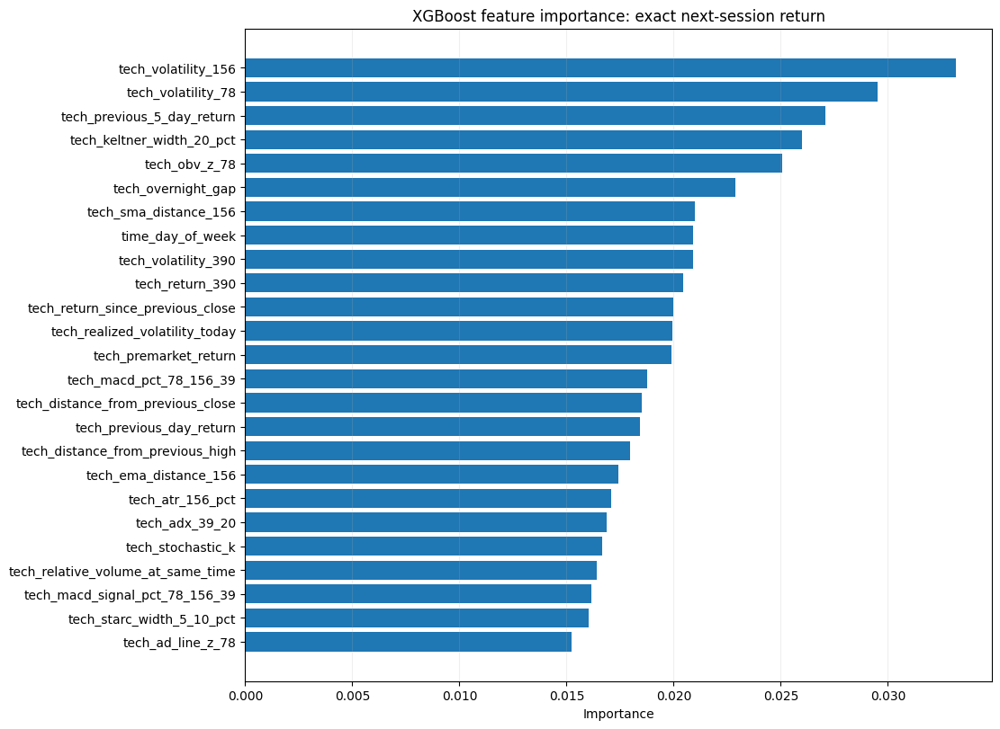

{'exact_return_diagnostics': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_xgboost_next_day_exact_return\\xgboost_exact_return_diagnostics.png',
 'exact_return_feature_importance': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_xgboost_next_day_exact_return\\xgboost_exact_return_feature_importance.png'}

In [9]:
import importlib
import kline_2day_forecaster.evaluation
import kline_2day_forecaster

importlib.reload(kline_2day_forecaster.evaluation)
importlib.reload(kline_2day_forecaster)

from kline_2day_forecaster import plot_exact_return_results

plots = plot_exact_return_results(
    "outputs/tqqq_xgboost_next_day_exact_return",
    model="xgboost",
    rolling_bars=390,
    max_time_points=2_000,
    top_features=25,
    show=True,
)

plots

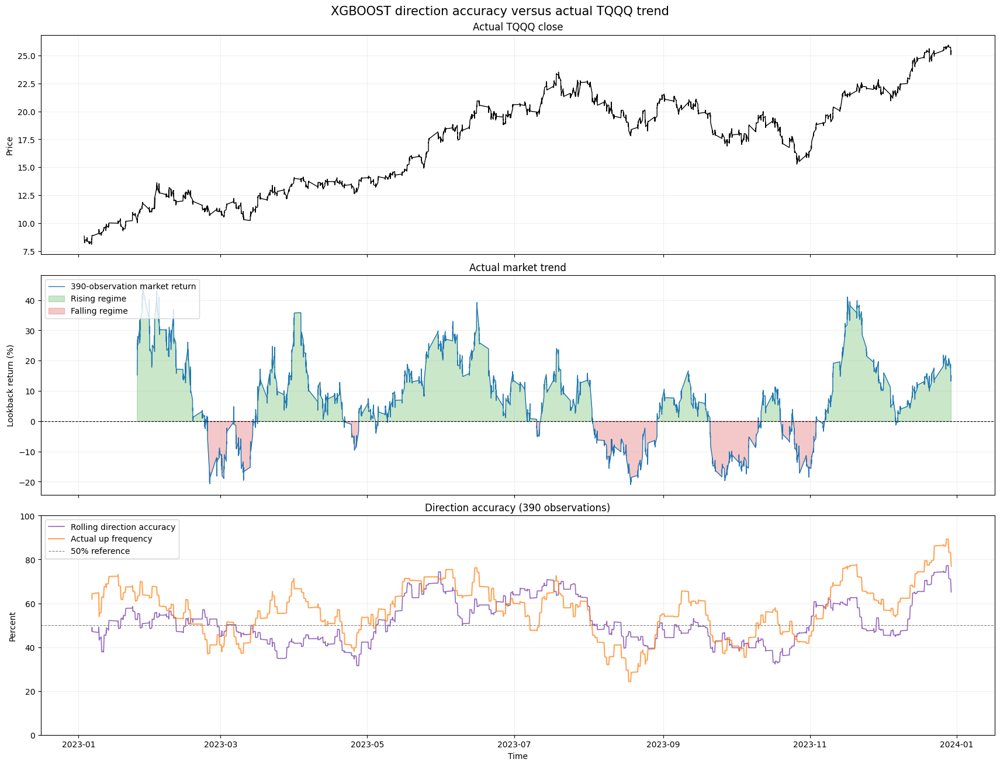

{'plot_path': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_xgboost_next_day_exact_return\\xgboost_direction_accuracy_vs_market_trend.png',
 'rolling_data_csv': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_xgboost_next_day_exact_return\\xgboost_direction_accuracy_vs_market_trend.csv',
 'regime_summary_csv': 'C:\\Users\\TonyTang\\Documents\\chan.py\\outputs\\tqqq_xgboost_next_day_exact_return\\xgboost_direction_accuracy_by_market_regime.csv'}

In [10]:
import importlib
import kline_2day_forecaster.evaluation
import kline_2day_forecaster

importlib.reload(kline_2day_forecaster.evaluation)
importlib.reload(kline_2day_forecaster)

from kline_2day_forecaster import plot_direction_accuracy_vs_market_trend

result = plot_direction_accuracy_vs_market_trend(
    "outputs/tqqq_xgboost_next_day_exact_return",
    model="xgboost",

    # Rolling prediction accuracy
    accuracy_rolling_bars=390,

    # Actual market trend:
    # close / close 390 sampled observations ago - 1
    trend_lookback_bars=390,

    show=True,
)

result